In [ ]:
!sudo apt-get install -y fonts-nanum
!sudo fc-cache -fv
!rm ~/.cache/matplotlib -rf

In [ ]:
!apt-get update -qq
!apt-get install fonts-nanum* -qq

In [ ]:
pip install dataprep

In [ ]:
pip install catboost

# import 패키지

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# 기본 패키지
import os
import time
import pandas as pd
import numpy as np
from datetime import date, datetime
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler
import calendar

# 시각화 패키지
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
from collections import Counter
import matplotlib as mpl
import matplotlib.font_manager as fm
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import plotly.express as px
import plotly.graph_objs as go

# 경고 메시지 무시
import warnings
warnings.filterwarnings(action='ignore')

# 클러스터링
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer

# TF-IDF
from sklearn.feature_extraction.text import TfidfTransformer

#모델링
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.cluster import KMeans, MiniBatchKMeans
from imblearn.over_sampling import RandomOverSampler, SMOTE
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
import sklearn.metrics as mt
from sklearn.ensemble import VotingClassifier
from sklearn.model_selection import StratifiedKFold
from statsmodels.stats.outliers_influence import variance_inflation_factor

#Machine Learning
import lightgbm as lgb
import xgboost as xgb
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
import sklearn.svm as svm
from xgboost import XGBClassifier
from catboost import CatBoostClassifier

#Evaluation
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, roc_auc_score, average_precision_score
from sklearn.metrics import confusion_matrix, precision_recall_curve, roc_curve, classification_report
from sklearn.model_selection import cross_val_score, cross_validate

#HyperParameters
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from scipy.stats import uniform, randint
from sklearn.metrics import fbeta_score, make_scorer

#신경망
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
import tensorflow as tf
from tensorflow import keras

In [ ]:
import tensorflow as tf

# GPU 사용 설정
device_name = tf.test.gpu_device_name()
if not tf.config.list_physical_devices('GPU'):
    print("GPU를 찾을 수 없습니다. 런타임 유형을 GPU로 변경해주세요.")
else:
    print(f"GPU 장치: {device_name}")

GPU 장치: /device:GPU:0


In [ ]:
import matplotlib.pyplot as plt
plt.rc('font', family='NanumBarunGothic')

# Preprocessing

In [ ]:
demo = pd.read_csv('LPOINT_BIG_COMP_01_DEMO.csv')
demo.columns = ['고객번호','성별','연령대','거주지대분류코드']

buy = pd.read_csv('LPOINT_BIG_COMP_02_PDDE.csv')
buy.columns = ['고객번호','영수증번호','온오프구분','제휴사','점포코드','상품코드','구매일자','구매시간','구매금액','구매수량']
buy['온오프구분'] = buy['온오프구분'].replace(1, '오프라인').replace(2, '온라인')
buy['제휴사'] = buy['제휴사'].replace('A01','유통사01').replace('A02','유통사02').replace('A03','유통사03').replace('A04','유통사04').replace('A05','유통사05').replace('A06','유통사06')

affi = pd.read_csv('LPOINT_BIG_COMP_03_COP_U.csv')
affi.columns = ['고객번호','영수증번호','제휴사','점포코드','온오프구분','이용일자','방문일자','구매시간','이용금액']
affi['제휴사'] = affi['제휴사'].replace('B01','숙박업종').replace('C01','엔터테인먼트01').replace('C02','엔터테인먼트02').replace('D01','F&B01').replace('D02','F&B02').replace('E01','렌탈업종')
affi['온오프구분'] = affi['온오프구분'].replace(1, '오프라인').replace(2, '온라인')

product = pd.read_csv('LPOINT_BIG_COMP_04_PD_CLAC.csv')
product.columns = ['상품코드','상품명','대분류명','중분류명']

store = pd.read_csv('LPOINT_BIG_COMP_05_BR.csv')
store.columns = ['점포코드','제휴사','점포대분류코드','점포중분류코드']
store['제휴사'] = store['제휴사'].replace('A01','유통사01').replace('A02','유통사02').replace('A03','유통사03').replace('A04','유통사04').replace('A05','유통사05').replace('A06','유통사06')
store['제휴사'] = store['제휴사'].replace('B01','숙박업종').replace('C01','엔터테인먼트01').replace('C02','엔터테인먼트02').replace('D01','F&B01').replace('D02','F&B02').replace('E01','렌탈업종')

lpay = pd.read_csv('LPOINT_BIG_COMP_06_LPAY.csv')
lpay.columns = ['고객번호','영수증번호','제휴사','온오프구분','이용일자','이용시간','이용금액']
lpay['제휴사'] = lpay['제휴사'].replace('A01','유통사01').replace('A02','유통사02').replace('A03','유통사03').replace('A04','유통사04').replace('A05','유통사05').replace('A06','유통사06')
lpay['제휴사'] = lpay['제휴사'].replace('B01','숙박업종').replace('C01','엔터테인먼트01').replace('C02','엔터테인먼트02').replace('D01','F&B01').replace('D02','F&B02').replace('E01','렌탈업종')
lpay['제휴사'] = lpay['제휴사'].replace('L00','기타제휴사').replace('L01','비제휴사')
lpay['온오프구분'] = lpay['온오프구분'].replace(1, '오프라인').replace(2, '온라인')

In [ ]:
# 상품구매정보.csv

df_buy_demo = pd.merge(buy, demo, how='inner', on='고객번호')
df_buy_demo_product = pd.merge(df_buy_demo, product, how='inner', on='상품코드')
store_drop = store.drop('제휴사', axis=1)
df_buy_demo_product_store = pd.merge(df_buy_demo_product, store_drop, how='left', on='점포코드')

df_buy_demo_product_store['구매일자']= df_buy_demo_product_store['구매일자'].astype('str')
df_buy_demo_product_store['구매일자']= df_buy_demo_product_store['구매일자'].apply(lambda _ : datetime.strptime(_,'%Y%m%d'))
#df_buy_demo_product_store.to_csv('상품구매정보.csv', index=False)

# 함수 모음

## 2.2 고객세분화

In [ ]:
def rfm_month(data, process):
  df = data.copy()

  rfm_total = pd.DataFrame()

  for i in range(1, 13):
    df_mon = df[df['월']==i]

    df_rfm = process(df_mon)
    df_rfm.insert(0, '월', i)

    rfm_total = pd.concat([rfm_total, df_rfm], axis=0)

  return rfm_total

In [ ]:
def avg_vfm_process(data):
  df = data.copy()

  # cust_id
  lst_cust = df.groupby('고객번호')['금액'].sum().index.tolist()

  # Avg_Visit
  df_visit = df.groupby('고객번호')['날짜'].nunique().reset_index().rename(columns={'날짜':'Visit'})
  df_con = df.groupby('고객번호').agg({'날짜': ['min', 'max']}).rename(columns={'min':'첫구매', 'max':'마지막구매'}).reset_index()
  df_con.columns = ['고객번호', '첫구매', '마지막구매']
  df_con['Continuation'] = pd.to_datetime(df_con['마지막구매'].astype(str)) - pd.to_datetime(df_con['첫구매'].astype(str))
  df_con['Continuation'] = df_con['Continuation'].dt.days
  df_con = df_con[['고객번호','Continuation']]
  df_mer = pd.concat([df_con, df_visit], axis=1)
  df_mer['avg_visit'] = df_mer['Continuation'] / (df_mer['Visit'] -1)

  df_mer = df_mer.replace(np.NaN, 30)
  lst_mer = df_mer['avg_visit'].tolist()

  # Frequency
  lst_fre = df.groupby('고객번호')['영수증번호'].nunique().tolist()

  # Money
  lst_money = df.groupby('고객번호')['금액'].sum().tolist()
  df_rfm = pd.DataFrame({'고객번호': lst_cust, 'Avg_Visit': lst_mer,'Frequency': lst_fre, 'Monetary': lst_money})

  return df_rfm

## 2.3 클러스터링 함수

In [ ]:
def kelbow(data):

  # 군집화를 위한 데이터 스케일링
  df = data.copy()
  df = df.iloc[:, 2:] ###바뀜

  df = np.log1p(df)

  standard_scaler = StandardScaler()
  df_scale = pd.DataFrame(standard_scaler.fit_transform(df), columns=df.columns)

  # 모델 생성
  model = KMeans(init='k-means++', random_state=42)
  visualizer = KElbowVisualizer(model, k=(2,10))
  visualizer.fit(df_scale)
  visualizer.show()

In [ ]:
def clustering(data, num):
  df = data.copy()
  df_index = df.iloc[:, :2] ### 바뀜
  df = df.iloc[:, 2:] ### 바뀜

  df = np.log1p(df) # 로그변환

  standard_scaler = StandardScaler()
  df_scale = pd.DataFrame(standard_scaler.fit_transform(df), columns=df.columns) # scaled된 데이터

  model = KMeans(n_clusters=num, init='k-means++', random_state=42)
  model.fit(df_scale)
  predict = pd.DataFrame(model.predict(df_scale))
  predict.columns=['predict']

  df_index = df_index.reset_index(drop=True)
  df = df.reset_index(drop=True)
  predict = predict.reset_index(drop=True)

  r = pd.concat([df_index, data.iloc[:, 2:].reset_index(drop=True), predict], axis=1)
  return r.sort_values(by='predict')

In [ ]:
def clustering_model(data, num):
  df = data.copy()
  df_index = df.iloc[:, :2] ### 바뀜
  df = df.iloc[:, 2:] ### 바뀜

  df = np.log1p(df) # 로그변환

  standard_scaler = StandardScaler()
  df_scale = pd.DataFrame(standard_scaler.fit_transform(df), columns=df.columns) # scaled된 데이터

  model = KMeans(n_clusters=num, init='k-means++', random_state=42)
  model.fit(df_scale)
  return model

In [ ]:
def predict_cluster(model, data):
    df = data.copy()
    df_index = df.iloc[:, :2]
    df = df.iloc[:, 2:]
    df = np.log1p(df) # 로그변환

    standard_scaler = StandardScaler()
    df_scale = pd.DataFrame(standard_scaler.fit_transform(df), columns=df.columns) # 스케일링

    predict = pd.DataFrame(model.predict(df_scale))
    predict.columns=['predict']

    df_index = df_index.reset_index(drop=True)
    df = df.reset_index(drop=True)
    predict = predict.reset_index(drop=True)

    r = pd.concat([df_index, data.iloc[:, 2:].reset_index(drop=True), predict], axis=1)
    return r.sort_values(by='predict')

## 2.4 이탈 예측 모델 함수

In [ ]:
def f_score(beta,y_real, y_pred):
    beta = beta
    pr = precision_score(y_real, y_pred)
    re = recall_score(y_real, y_pred)
    score = (1+beta**2)*(pr*re)/((beta**2*pr)+re)
    return score

In [ ]:
def evaluate(y_real,y_pred, y_prob):
    acc = accuracy_score(y_real, y_pred)
    pre = precision_score(y_real, y_pred)
    rec = recall_score(y_real, y_pred)
    f1 = f1_score(y_real, y_pred)
    f2 = f_score(1.5,y_real, y_pred)
    f3 = f_score(2,y_real, y_pred)
    auc1 = average_precision_score(y_real, y_prob)
    auc2 = roc_auc_score(y_real, y_prob)
    print('Accuracy : {:.6f}'.format(acc)) #정확도 : 예측이 정답과 얼마나 정확한가
    print('Precision : {:.6f}'.format(pre)) #정밀도 : 예측한 것 중에서 정답의 비율
    print('Recall : {:.6f}'.format(rec)) #재현율 : 정답 중에서 예측한 것의 비율
    print('F1 score : {:.6f}'.format(f1)) #정밀도와 재현율의 (조화)평균 - 정밀도와 재현율이 비슷할수록 높은 점수
    print('F1.5 score : {:.6f}'.format(f2))
    print('F2 score : {:.6f}'.format(f3))
    print('PR curve_auc score : {:.6f}'.format(auc1))
    print('ROC curve_auc score : {:.6f}'.format(auc2))
    print('\nConfusion Matrix : \n {}'.format(confusion_matrix(y_real, y_pred, labels = [1,0]))) # labels를 설정해주지 않으면 순서가 바뀜

    score_list = [acc,pre,rec,f1,f2,f3,auc1,auc2]
    score_box = np.array(score_list)
    return score_box

In [ ]:
def evaluate_m(y_real, y_pred):
    acc = accuracy_score(y_real, y_pred)
    macro_pre = precision_score(y_real, y_pred, average='macro')
    macro_rec = recall_score(y_real, y_pred, average='macro')
    macro_f1 = f1_score(y_real, y_pred, average='macro')
    weighted_f1 = f1_score(y_real, y_pred, average='weighted')
    cm = confusion_matrix(y_real, y_pred)

    print('Accuracy: {:.6f}'.format(acc))
    print('Macro Precision: {:.6f}'.format(macro_pre))
    print('Macro Recall: {:.6f}'.format(macro_rec))
    print('Macro F1 score: {:.6f}'.format(macro_f1))
    print('Weighted F1 score: {:.6f}'.format(weighted_f1))
    print('Confusion Matrix:\n{}'.format(cm))

    score_list = [acc, macro_pre, macro_rec, macro_f1, weighted_f1]
    score_box = np.array(score_list)
    return score_box

In [ ]:
def graph_f_score(i,j,k,y_real,y_pred):
    x_range = np.arange(i,j,k)
    score = []
    for kk in x_range:
        score.append(f_score(kk,y_real,y_pred))
    score = np.array(score)
    plt.figure(figsize=(10,5))
    plt.plot(x_range, score,'-o')
    plt.title('F-score by weight')
    plt.xlabel('weight')
    plt.ylabel('f-score')

In [ ]:
def precision_recall_thresholds(y_val, y_prob):
    precisions, recalls, thresholds = precision_recall_curve(y_val, y_prob)
    plt.figure(figsize = (15,5))
    plt.plot(thresholds, recalls[:-1], color = 'red', label = 'recall')
    plt.plot(thresholds, precisions[:-1], color = 'blue', label = 'precision')
    plt.title('thresholds VS recalls VS precisions')
    plt.xlabel('thresholds')
    plt.legend(loc = 'best')

In [ ]:
def calculate_scores(y_test, y_prob, thresholds):
    score_boxes = []
    for threshold in thresholds:
        y_pre = np.where(y_prob >= threshold, 1, 0)
        score_box = evaluate(y_test, y_pre, y_prob)
        score_boxes.append(score_box)
    return score_boxes

# 사용 예시
#thresholds = np.arange(0.1, 0.6, 0.1)
#score_boxes = calculate_scores(y_test, y_prob, thresholds)


In [ ]:
def plot_scores(score_boxes, thresholds):

    labels = ['Accuracy', 'Precision', 'Recall']
    x = np.arange(len(score_boxes))
    fig, ax = plt.subplots()
    width = 0.2

    for i in range(3):
        scores = [score_box[i] for score_box in score_boxes]
        ax.bar(x + i * width, scores, width, label=labels[i])

    ax.set_ylabel('Score')
    ax.set_xlabel('Threshold')
    ax.set_title('Scores for Different Thresholds')
    ax.set_xticks(x)
    ax.set_xticklabels([f'{threshold:.1f}' for threshold in thresholds])
    ax.legend()

    plt.show()


In [ ]:
def get_sen_cv(x, y):
    # 민감도를 scoring 함수로 설정
    scorer = make_scorer(recall_score)

    # XGBoost 분류기 초기화
    xg_model = xgb.XGBClassifier(subsample=0.5,n_estimators=200,max_depth=7,learning_rate=0.01,gamma=0,colsample_bytree=0.7,random_state=42)

    # 교차 검증 설정 및 수행
    cv_results = cross_validate(xg_model, x, y, cv=5, scoring=scorer)

    # 민감도 값 추출
    sensitivity_scores = cv_results['test_score']

    return sensitivity_scores

In [ ]:
def find_missing_customers(df,df_target, target_month):
    target_df = df[df['월'] == target_month]
    missing_customers = df_target[~df_target['고객번호'].isin(target_df['고객번호'])]
    return missing_customers

In [ ]:
def fillna_by_group(df, value_cols1,value_cols2, fillna_value1,fillna_value2):
    df_filled = df.pivot_table(index='고객번호', columns='월').reset_index()

    for col_range in value_cols1:
        start_col, end_col = col_range
        df_filled.iloc[:, start_col:end_col] = df_filled.iloc[:, start_col:end_col].fillna(fillna_value1)

    for col_range in value_cols2:
        start_col, end_col = col_range
        df_filled.iloc[:, start_col:end_col] = df_filled.iloc[:, start_col:end_col].fillna(fillna_value2)

    return df_filled


In [ ]:
# 다음달 이탈 등급 예측
def merge_predictions(df_A, df, month):
    df_A_list = df_A['고객번호'].tolist()

    con_A = (df['고객번호'].isin(df_A_list)) & (df['월'] == month)
    con_A_df = df.loc[con_A, ['고객번호', 'predict']]

    df_predict = pd.merge(df_A, con_A_df, on='고객번호', how='left')
    df_predict= df_predict.drop('고객번호', axis=1)
    df_predict['predict'] = df_predict['predict'].fillna(6)

    return df_predict

# 2.2 고객 세분화

## Preprocessing

In [ ]:
# 데이터 불러오기

buy_1 = pd.read_csv('LPOINT_BIG_COMP_02_PDDE.csv')
buy_1.columns = ['고객번호','영수증번호','온오프구분','제휴사','점포코드','상품코드','날짜','시간','금액','구매수량']
buy_1['온오프구분'] = buy_1['온오프구분'].replace(1, '오프라인').replace(2, '온라인')
buy_1['제휴사'] = buy_1['제휴사'].replace('A01','유통사01').replace('A02','유통사02').replace('A03','유통사03').replace('A04','유통사04').replace('A05','유통사05').replace('A06','유통사06')
buy_1 = buy_1.drop_duplicates()
#buy_1['구매일자']= buy_1['구매일자'].astype('str').apply(lambda _ : datetime.strptime(_,'%Y%m%d'))

affi_1 = pd.read_csv('LPOINT_BIG_COMP_03_COP_U.csv')
affi_1.columns = ['고객번호','영수증번호','제휴사','점포코드','온오프구분','이용일자','날짜','시간','금액']
affi_1['제휴사'] = affi_1['제휴사'].replace('B01','숙박업종').replace('C01','엔터테인먼트01').replace('C02','엔터테인먼트02').replace('D01','F&B01').replace('D02','F&B02').replace('E01','렌탈업종')
affi_1['온오프구분'] = affi_1['온오프구분'].replace(1, '오프라인').replace(2, '온라인')
# 중복행 없음
#affi_1['방문일자']= affi_1['방문일자'].astype('str').apply(lambda _ : datetime.strptime(_,'%Y%m%d'))

lpay = pd.read_csv('LPOINT_BIG_COMP_06_LPAY.csv')
lpay.columns = ['고객번호','영수증번호','제휴사','온오프구분','날짜','시간','금액']
lpay['제휴사'] = lpay['제휴사'].replace('A01','유통사01').replace('A02','유통사02').replace('A03','유통사03').replace('A04','유통사04').replace('A05','유통사05').replace('A06','유통사06')
lpay['제휴사'] = lpay['제휴사'].replace('B01','숙박업종').replace('C01','엔터테인먼트01').replace('C02','엔터테인먼트02').replace('D01','F&B01').replace('D02','F&B02').replace('E01','렌탈업종')
lpay['제휴사'] = lpay['제휴사'].replace('L00','기타제휴사').replace('L01','비제휴사')
lpay['온오프구분'] = lpay['온오프구분'].replace(1, '오프라인').replace(2, '온라인')
lpay['점포코드'] = 'NaN'
# 중복행없음

In [ ]:
buy_sel = buy_1[['고객번호','영수증번호','온오프구분','제휴사','점포코드','날짜','시간','금액']]
aff_sel = affi_1[['고객번호','영수증번호','온오프구분','제휴사','점포코드','날짜','시간','금액']]
#lp_sel = lpay[['고객번호','영수증번호','온오프구분','제휴사','점포코드','날짜','시간','금액']]

In [ ]:
# lpay 데이터 중복 제거 처리

buy_aff = pd.concat([buy_sel, aff_sel], axis=0)
df_merge = pd.merge(buy_aff, lpay, on=['고객번호','온오프구분','제휴사','날짜','시간','금액'], how='outer', indicator=True)
lpay_only = df_merge[df_merge['_merge']=='right_only']
lpay_only = lpay_only[['고객번호','영수증번호_y','제휴사','점포코드_y','온오프구분','날짜','시간','금액']]
lpay_only.columns = ['고객번호','영수증번호','제휴사','점포코드','온오프구분','날짜','시간','금액']
lpay_only = lpay_only[lpay_only['제휴사']!='비제휴사'] # 비제휴사를 제외해줌

,고객번호,영수증번호,제휴사,점포코드,온오프구분,날짜,시간,금액
4393716,M629656521,2.108032e+14,유통사03,NaN,오프라인,20210803,21,10900.0
4393718,M737010483,2.108030e+14,유통사06,NaN,온라인,20210803,4,36740.0
4393719,M707775545,2.108031e+14,유통사06,NaN,온라인,20210803,14,138500.0
4393720,M848083175,2.108032e+14,유통사01,NaN,오프라인,20210803,18,14000.0
4393721,M253450307,2.108032e+14,엔터테인먼트01,NaN,온라인,20210803,16,1000.0
...,...,...,...,...,...,...,...,...
4694335,M470112503,2.101042e+14,유통사06,NaN,온라인,20210104,21,50920.0
4694336,M470112503,2.101251e+14,유통사06,NaN,온라인,20210125,11,51800.0
4694337,M470112503,2.101042e+14,유통사06,NaN,온라인,20210104,21,6440.0
4694338,M748878049,2.101192e+14,유통사02,NaN,오프라인,20210119,20,17600.0


In [ ]:
# 병합 및 전처리

cs_total = pd.concat([buy_sel, aff_sel, lpay_only], axis=0).drop_duplicates()

cs_total['날짜']= cs_total['날짜'].astype('str').apply(lambda _ : datetime.strptime(_,'%Y%m%d'))
cs_total['월'] = cs_total['날짜'].dt.month

# 이상치 고객 제거하기
lst_cust = ['M057015266','M103897322','M919374790','M343264688','M124357021']
cs_total = cs_total[~cs_total['고객번호'].isin(lst_cust)]

# 방문횟수가 5회 이상인 고객만 남기기
df_cust = cs_total[['고객번호','날짜']]
df_cust = cs_total.groupby('고객번호')['날짜'].nunique().reset_index()
lst_old_cust = list(df_cust[df_cust['날짜']>=5]['고객번호'].unique())
cs_total = cs_total[cs_total['고객번호'].isin(lst_old_cust)]

df = cs_total.copy()
df

,고객번호,영수증번호,온오프구분,제휴사,점포코드,날짜,시간,금액,월
0,M430112881,A01000001113,오프라인,유통사01,A010039,2021-01-01,10,15000.0,1
1,M646853852,A01000002265,오프라인,유통사01,A010025,2021-01-01,10,79700.0,1
2,M430112881,A01000003148,오프라인,유통사01,A010039,2021-01-01,10,19000.0,1
4,M430112881,A01000004946,오프라인,유통사01,A010039,2021-01-01,10,19000.0,1
5,M430112881,A01000005297,오프라인,유통사01,A010039,2021-01-01,10,9900.0,1
...,...,...,...,...,...,...,...,...,...
4694335,M470112503,210104210651243.0,온라인,유통사06,NaN,2021-01-04,21,50920.0,1
4694336,M470112503,210125110644545.0,온라인,유통사06,NaN,2021-01-25,11,51800.0,1
4694337,M470112503,210104210652271.0,온라인,유통사06,NaN,2021-01-04,21,6440.0,1
4694338,M748878049,210119200278240.0,오프라인,유통사02,NaN,2021-01-19,20,17600.0,1


In [ ]:
# 상품구매/제휴사 분리 전처리

buy_lst = ['유통사01','유통사02','유통사03','유통사04','유통사05','유통사06']
aff_lst = ['숙박업종', 'F&B01', '엔터테인먼트01', 'F&B02', '엔터테인먼트02', '렌탈업종']

df_buy = df[df['제휴사'].isin(buy_lst)]
df_aff = df[df['제휴사'].isin(aff_lst)]

## 2.2.1 변형된 RFM

In [ ]:
buy_rfm = rfm_month(df_buy, avg_vfm_process)
buy_rfm.columns = ['월','고객번호','P_Avg_Visit', 'P_Frequency', 'P_Money']

aff_rfm = rfm_month(df_aff, avg_vfm_process)
aff_rfm.columns = ['월','고객번호','A_Avg_Visit', 'A_Frequency', 'A_Money']

df_mer = pd.merge(buy_rfm, aff_rfm, on=['월','고객번호'], how='outer').fillna(0)
df_mer['P_Avg_Visit'] = df_mer['P_Avg_Visit'].replace(0, 30)
df_mer['A_Avg_Visit'] = df_mer['A_Avg_Visit'].replace(0, 30)
df_mer.head()

,월,고객번호,P_Avg_Visit,P_Frequency,P_Money,A_Avg_Visit,A_Frequency,A_Money
0,1,M000034966,30.000000,3.0,152200.0,30.0,0.0,0.0
1,1,M000136117,2.750000,20.0,11605470.0,30.0,0.0,0.0
2,1,M000261625,30.000000,2.0,242000.0,30.0,0.0,0.0
3,1,M000419293,30.000000,5.0,565800.0,30.0,0.0,0.0
4,1,M000494848,1.529412,28.0,1037850.0,30.0,0.0,0.0
...,...,...,...,...,...,...,...,...
239449,12,M998376249,30.000000,0.0,0.0,30.0,1.0,5400.0
239450,12,M998490307,30.000000,0.0,0.0,30.0,1.0,19400.0
239451,12,M998844493,30.000000,0.0,0.0,30.0,1.0,4000.0
239452,12,M999428656,30.000000,0.0,0.0,23.0,2.0,21200.0


## 2.2.2 K-Means Clustering 고객 세분화

### 2.2.2.1 Elbow Method 최적 군집 개수 결정

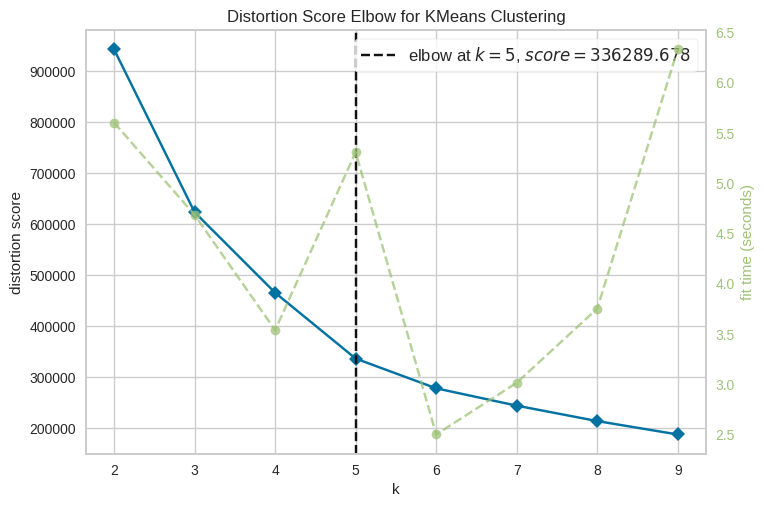

In [ ]:
kelbow(df_mer)

### 2.2.2.2 고객 세분화 군집 결과

In [ ]:
df_clust = clustering_model(df_mer, 5)
df_median = df_clust.groupby(df_clust['predict']).median()
#round(df_clust.groupby(df_clust['predict']).median(),2)

,월,P_Avg_Visit,P_Frequency,P_Money,A_Avg_Visit,A_Frequency,A_Money
predict,,,,,,,
0,7.0,30.0,1.0,49000.0,30.0,0.0,0.0
1,7.0,30.0,0.0,0.0,30.0,1.0,16000.0
2,7.0,5.0,6.0,233597.5,30.0,1.0,13200.0
3,6.0,4.8,6.0,213230.0,30.0,0.0,0.0
4,7.0,5.0,7.0,211106.0,6.0,3.0,35300.0


In [ ]:
df_clust['predict'] = df_clust['predict'].replace(4, 11).replace(2, 22).replace(3, 33).replace(0, 44).replace(1, 55)
df_clust['predict'] = df_clust['predict'].replace(11,1).replace(22,2).replace(33,3).replace(44,4).replace(55,5)
round(df_clust.groupby(df_clust['predict']).median(),2)

,월,P_Avg_Visit,P_Frequency,P_Money,A_Avg_Visit,A_Frequency,A_Money
predict,,,,,,,
1,7.0,5.0,7.0,211106.0,6.0,3.0,35300.0
2,7.0,5.0,6.0,233597.5,30.0,1.0,13200.0
3,6.0,4.8,6.0,213230.0,30.0,0.0,0.0
4,7.0,30.0,1.0,49000.0,30.0,0.0,0.0
5,7.0,30.0,0.0,0.0,30.0,1.0,16000.0


# 2.3 클러스터별 이탈율

In [ ]:
#사용 데이터 "Avg_VFM" 로드- 중점 데이터
df=pd.read_csv('/content/drive/MyDrive/롯데 데이터/고객이탈등급분류.csv')

## 2.3.1 이탈 정의

1. df를 월 기준으로 pivot 테이블을 생성하여, 각 월별 열에 대해 고객 행을 기준으로 등급을 데이터로 가지는 데이터 프레임 생성
2. 각 고객의 특정 월이 NaN인 경우 고객을 이탈로 정의

* 문제점 : 한 고객을 기준으로 이전달에 구매 이력이 없는 상태에서 NaN을 이탈로 볼 수 는 없음.

     -> 위 month_matrix에서 행 기준 첫 True 값 이전 False는 이탈로 정의할 수 없으므로 True로 변환.  <br>
(전체 NaN을 세는 것이 아닌 첫 구매 이후 부터의 NaN을 셈)



In [ ]:
#이탈 정의에 따른 고객을 행 각 월을 열로 가지며 각 열의 값이 등급인 데이터 프레임 생성


#월 기준, 등급을 값으로 가지는 피벗테이블 생성
month_matrix = df.pivot_table(index='고객번호', columns='월', values='predict')
month_matrix.reset_index(inplace=True) #고객번호를 열로 변경 해줌
month_matrix['이탈횟수'] = month_matrix.isna().sum(axis=1)

#열 지정
cols = month_matrix.columns[1:13]

#nan인 경우를 True, 아닌 경우를 False로 하는 DataFrame 생성
mask = month_matrix[cols].isna()

#첫번째 False 이전의 True들은 False로 변경
for i, row in mask.iterrows():
    if True in row.values:
        first_false_idx = (row == False).idxmax()
        mask.loc[i, cols[:first_false_idx]] = False

mask.head()

월,1,2,3,4,5,6,7,8,9,10,11,12
0,False,True,False,True,True,False,True,False,False,False,True,False
1,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,True,False,False,False,True,False,False,False,False


## 2.3.2 클러스터별 이탈 확인

### 2.3.2.1 연 기준: 클러스터별 이탈 건수의 크기

In [ ]:
#전체 이탈 수
total_count = mask.iloc[:, 1:].sum().sum()

#첫 열을 제외한 열에서 True인 위치를 구한다.-1월 달의 경우 이전 달의 등급이 존재하지 않기 때문
true_idx = np.where(mask.iloc[:, 1:])

#nan, 1,2,3,4,5의 count를 초기화한다.
nan_count, one_count, two_count, three_count, four_count,five_count, = (0, 0, 0, 0, 0, 0)

#true_idx의 각 위치에 대해 값이 nan, 0, 1, 2, 3, 4인 경우 count를 증가한다.(month_matrix에는 고객번호 열이 하나 더 있어서 열에 +1)
for i, j in zip(*true_idx):
    col = j if month_matrix.iloc[i, j+1] is not np.nan else j-1
    if col == -1:
        continue
    val = month_matrix.iloc[i, col+1]
    if pd.isna(val):
        nan_count += 1
    elif val == 1:
        one_count += 1
    elif val == 2:
        two_count += 1
    elif val == 3:
        three_count += 1
    elif val == 4:
        four_count += 1
    elif val == 5:
        five_count += 1

In [ ]:
#연 기준 : 이탈 건수 크기 비교
pn_n=nan_count/total_count*100
p1_n=one_count/total_count*100
p2_n=two_count/total_count*100
p3_n=three_count/total_count*100
p4_n=four_count/total_count*100
p5_n=five_count/total_count*100

print(f'전체 이탈에 대해 이전 달이 nan인 경우가 차지하는 비율  :{pn_n:.2f}')
print(f'전체 이탈에 대해 이전 달이 1 경우가 차지하는 비율  :{p1_n:.2f}')
print(f'전체 이탈에 대해 이전 달이 2 경우가 차지하는 비율  :{p2_n:.2f}')
print(f'전체 이탈에 대해 이전 달이 3 경우가 차지하는 비율  :{p3_n:.2f}')
print(f'전체 이탈에 대해 이전 달이 4 경우가 차지하는 비율  :{p4_n:.2f}')
print(f'전체 이탈에 대해 이전 달이 5 경우가 차지하는 비율  :{p5_n:.2f}')


전체 이탈에 대해 이전 달이 nan인 경우가 차지하는 비율  :39.07
전체 이탈에 대해 이전 달이 1 경우가 차지하는 비율  :1.96
전체 이탈에 대해 이전 달이 2 경우가 차지하는 비율  :4.41
전체 이탈에 대해 이전 달이 3 경우가 차지하는 비율  :12.41
전체 이탈에 대해 이전 달이 4 경우가 차지하는 비율  :28.19
전체 이탈에 대해 이전 달이 5 경우가 차지하는 비율  :13.96


1. mask 데이터 프레임 기준, False의 위치를 구함.
2. 알아낸 위치 이전 열의 값을 각 NaN,0,~5와 대조
3. 특정 값에 해당하는 경우, 특정 값의 카운트를 +1
4. 각 등급 카운트를 전체 1년 동안 월 기준으로 일어난 모든 이탈 건수로 나누고 100을 곱해하여, 연 기준 등급별 이탈 건수 크기(비율)을 구함
* 고려: 1월 고객의 경우, 전년도 12월 달의 등급을 알 수 없으므로 제외함.


### 2.3.2.3 연 기준 : 클러스터별 이탈율




In [ ]:
#각 등급별 다음달 이탈 확률 ([이탈 이전 달에 x가 존재하는 수(즉 1~11월)]]/[1~11월에 존재하는 모든 x의 수])
#각 등급별로 각 등급의 수로 나눈 값이므로 절대적 비율,확률을 확인 할 수 있음.
Total_grade=df['predict'].value_counts().sum()
print(Total_grade)
p1_G = df[df['월'] != 12]['predict'].value_counts()[1]
p2_G = df[df['월'] != 12]['predict'].value_counts()[2]
p3_G = df[df['월'] != 12]['predict'].value_counts()[3]
p4_G = df[df['월'] != 12]['predict'].value_counts()[4]
p5_G = df[df['월'] != 12]['predict'].value_counts()[5]

#위에서 nan 이전에 나온 0~4의 수는 각 zero~four_count에 저장됨.

print(f"1의 이탈 확률:{one_count/p1_G:0.2f}  비이탈율:{1-one_count/p1_G:0.2f}  등급 1의 1~11월 Total: {p1_G}")
print(f"2의 이탈 확률:{two_count/p2_G:0.2f}  비이탈율:{1-two_count/p2_G:0.2f}  등급 2의 1~11월 Total: {p2_G}")
print(f"3의 이탈 확률:{three_count/p3_G:0.2f}  비이탈율:{1-three_count/p3_G:0.2f}  등급 3의 1~11월 Total: {p3_G}")
print(f"4의 이탈 확률:{four_count/p4_G:0.2f}  비이탈율:{1-four_count/p4_G:0.2f}  등급 4의 1~11월 Total: {p4_G}")
print(f"5의 이탈 확률:{five_count/p5_G:0.2f}  비이탈율:{1-five_count/p5_G:0.2f}  등급 5의 1~11월 Total: {p5_G}")

239454
1의 이탈 확률:0.03  비이탈율:0.97  등급 1의 1~11월 Total: 30183
2의 이탈 확률:0.05  비이탈율:0.95  등급 2의 1~11월 Total: 41398
3의 이탈 확률:0.08  비이탈율:0.92  등급 3의 1~11월 Total: 73014
4의 이탈 확률:0.23  비이탈율:0.77  등급 4의 1~11월 Total: 53396
5의 이탈 확률:0.29  비이탈율:0.71  등급 5의 1~11월 Total: 21519


1. 이전 등급별 카운트를 이번에는 등급별 총 인원 수로 각각 나누어, 등급 자체의 이탈 확률을 계산

### 2.3.2.2 & 4 월 기준: 이탈 건수 크기 & 이탈 비율

In [ ]:
#total 이탈수를 월별로 계산

total_month_nan_count = {}
for i in range(1, 12):
    total_month_nan_count[i+1] = mask.iloc[:, i].value_counts()[True]

#월별로 이탈 기준 이전 월의 등급 수를 계산
true_idx={}
for i in range(1,12):
    true_idx[i+1] = np.where(mask.iloc[:, i])

#월별로 등급별 total 수 저장
total_month_count1 = {}
for i in range(1, 12):
    total_month_count1[i+1] = month_matrix[i].value_counts()[1]

total_month_count2 = {}
for i in range(1, 12):
    total_month_count2[i+1] =  month_matrix[i].value_counts()[2]

total_month_count3 = {}
for i in range(1, 12):
    total_month_count3[i+1] =  month_matrix[i].value_counts()[3]

total_month_count4 = {}
for i in range(1, 12):
    total_month_count4[i+1] =  month_matrix[i].value_counts()[4]

total_month_count5 = {}
for i in range(1, 12):
    total_month_count5[i+1] =  month_matrix[i].value_counts()[5]


# (2) 월별 이탈에 대한 각 등급의 비율
probs = {}
for i in range(2,13):
    index = true_idx[i][0]
    counts = month_matrix.iloc[index,i-1].value_counts()
    result = {'1': counts.get(1, 0), '2': counts.get(2, 0), '3': counts.get(3, 0), '4': counts.get(4, 0), '5': counts.get(5, 0)}

    probs[i] = {'1군집의 이탈에 대한 비율': round(result['1']/total_month_nan_count[i], 4),
            '2군집의 이탈에 대한 비율': round(result['2']/total_month_nan_count[i], 4),
            '3군집의 이탈에 대한 비율': round(result['3']/total_month_nan_count[i], 4),
            '4군집의 이탈에 대한 비율': round(result['4']/total_month_nan_count[i], 4),
            '5군집의 이탈에 대한 비율': round(result['5']/total_month_nan_count[i], 4)}

# (4) 등급별 월 이탈 확률
probs_g = {}
for i in range(2,13):
    index = true_idx[i][0]
    counts = month_matrix.iloc[index,i-1].value_counts()
    result = {'1': counts.get(1, 0), '2': counts.get(2, 0), '3': counts.get(3, 0), '4': counts.get(4, 0), '5': counts.get(5, 0)}

    probs_g[i] = {'1군집의 다음 달 이탈 확률': round(result['1']/total_month_count1[i], 4),
                  '1군집의 다음 달 비이탈 확률': round(1-result['1']/total_month_count1[i], 4),
            '2군집의 다음 달 이탈 확률': round(result['2']/total_month_count2[i], 4),
            '2군집의 다음 달 비이탈 확률': round(1-result['2']/total_month_count2[i], 4),
            '3군집의 다음 달 이탈 확률': round(result['3']/total_month_count3[i], 4),
            '3군집의 다음 달 비이탈 확률': round(1-result['3']/total_month_count3[i], 4),
            '4군집의 다음 달 이탈 확률': round(result['4']/total_month_count4[i], 4),
            '4군집의 다음 달 비이탈 확률': round(1-result['4']/total_month_count4[i], 4),
            '5군집의 다음 달 이탈 확률': round(result['5']/total_month_count5[i], 4),
            '5군집의 다음 달 비이탈 확률': round(1-result['5']/total_month_count5[i], 4)}

In [ ]:
# (2) 월 기준 : 월별 이탈 건수_'보기 쉽게'
df_prob=pd.DataFrame(probs)
df_prob

,2,3,4,5,6,7,8,9,10,11,12
1군집의 이탈에 대한 비율,0.0192,0.0228,0.0191,0.0152,0.0233,0.0135,0.0168,0.0256,0.0171,0.0220,0.0194
2군집의 이탈에 대한 비율,0.0629,0.0462,0.0484,0.0418,0.0564,0.0370,0.0453,0.0446,0.0339,0.0456,0.0341
3군집의 이탈에 대한 비율,0.2002,0.1465,0.1346,0.1422,0.1423,0.1254,0.1199,0.0996,0.1096,0.1140,0.0888
4군집의 이탈에 대한 비율,0.5092,0.3516,0.3183,0.2754,0.2808,0.2595,0.2685,0.2495,0.2432,0.2564,0.2347
5군집의 이탈에 대한 비율,0.2085,0.1751,0.1351,0.1358,0.1323,0.1441,0.1231,0.1600,0.1224,0.1211,0.1238


In [ ]:
# (4) 월 기준 : 월별 이탈 비율_'보기 쉽게'
df_probs_g=pd.DataFrame(probs_g)
df_probs_g

,2,3,4,5,6,7,8,9,10,11,12
1군집의 다음 달 이탈 확률,0.0237,0.0291,0.0278,0.0201,0.0312,0.0197,0.0234,0.0359,0.0289,0.0389,0.0340
1군집의 다음 달 비이탈 확률,0.9763,0.9709,0.9722,0.9799,0.9688,0.9803,0.9766,0.9641,0.9711,0.9611,0.9660
2군집의 다음 달 이탈 확률,0.0446,0.0411,0.0473,0.0382,0.0583,0.0413,0.0500,0.0540,0.0392,0.0588,0.0444
2군집의 다음 달 비이탈 확률,0.9554,0.9589,0.9527,0.9618,0.9417,0.9587,0.9500,0.9460,0.9608,0.9412,0.9556
3군집의 다음 달 이탈 확률,0.0648,0.0660,0.0692,0.0673,0.0854,0.0791,0.0834,0.0798,0.0746,0.0917,0.0713
3군집의 다음 달 비이탈 확률,0.9352,0.9340,0.9308,0.9327,0.9146,0.9209,0.9166,0.9202,0.9254,0.9083,0.9287
4군집의 다음 달 이탈 확률,0.2330,0.2209,0.2352,0.1981,0.2454,0.2285,0.2501,0.2482,0.2189,0.2675,0.2311
4군집의 다음 달 비이탈 확률,0.7670,0.7791,0.7648,0.8019,0.7546,0.7715,0.7499,0.7518,0.7811,0.7325,0.7689
5군집의 다음 달 이탈 확률,0.2833,0.2984,0.2771,0.2688,0.2990,0.2969,0.2510,0.3242,0.2693,0.3191,0.2764
5군집의 다음 달 비이탈 확률,0.7167,0.7016,0.7229,0.7312,0.7010,0.7031,0.7490,0.6758,0.7307,0.6809,0.7236


# 2.4 이탈 예측

## 2.4.2 데이터 구축 및 모델링

### 2.4.2.1 데이터 구성

* 아래는 한 고객의 6개월 Avg_VFM데이터를 기반으로 구축한 데이터 프레임 예시이다.
* 고객의 6개월 동안 6가지의 Avg_RFM데이터와 6개월 동안 변화된 등급 그리고 이탈 여부가 각 열로 지정된다.
* 이때 고객이 전달 이후 월에 이탈이라면 이탈 열에 값이 1, 전달 이후 달에 기록이 존재한다면 0이 된다.

In [ ]:
df_six.head()

,고객번호,6Pre_A_Visit,5Pre_A_Visit,4Pre_A_Visit,3Pre_A_Visit,2Pre_A_Visit,Pre_A_Visit,6Pre_A_Frequency,5Pre_A_Frequency,4Pre_A_Frequency,...,3Pre_P_Money,2Pre_P_Money,Pre_P_Money,predict1,predict2,predict3,predict4,predict5,predict6,이탈
0,M000034966,30.0,30.0,30.0,30.0,30.0,30.0,0.0,0.0,0.0,...,0.0,0.0,65700.0,4.0,NaN,3.0,NaN,NaN,4.0,1
1,M000136117,30.0,30.0,11.0,30.0,30.0,30.0,0.0,1.0,2.0,...,0.0,954000.0,797000.0,3.0,2.0,1.0,5.0,3.0,2.0,0
2,M000225114,30.0,30.0,30.0,30.0,30.0,30.0,0.0,0.0,0.0,...,521310.0,25000.0,37110.0,NaN,NaN,3.0,3.0,2.0,4.0,0
3,M000261625,30.0,30.0,30.0,30.0,30.0,30.0,0.0,1.0,0.0,...,586800.0,65400.0,284800.0,4.0,2.0,3.0,3.0,4.0,3.0,0
4,M000350564,30.0,30.0,30.0,30.0,30.0,30.0,0.0,0.0,0.0,...,0.0,2887300.0,1200000.0,NaN,4.0,4.0,NaN,4.0,3.0,0


### 2.4.2.2 월 길이 별 모델 성능 비교

* 월 길이에 따른 데이터 프레임이 모두 다르기 때문에, 각 길이마다 전처리 과정이 필요함.
* 아래 결과는 [표 2.4-2] "월 길이와 모델 별 성능지표" 와 같음

* 모든 전처리 과정은 다음과 같다.

1. 기존 통합데이터 df를 월 길이에 따라 2개월이면 2개월씩, 6개월이면 6개월 씩 자른다.

2. 2개월 기준으로, 2개월 데이터 중 NaN값이 경우를 처리한다.

3. 2개월 기준에서 1~2월 데이터라면 그 특정 고객이 df상 3월에 방문기록이 없는 경우 이탈로 둔다.

4. 각 자른 데이터를 모두 행으로 두어 통합한다.

5. 기존 전처리 과정인 표준화와 RandomOverSampling을 적용한다.

In [ ]:
# 2개월 기준
# 전처리
df_A = df[(df['월'] == 1) | (df['월'] == 2)]
df_B = df[(df['월'] == 2) | (df['월'] == 3)]
df_C = df[(df['월'] == 3) | (df['월'] == 4)]
df_D = df[(df['월'] == 4) | (df['월'] == 5)]
df_E = df[(df['월'] == 5) | (df['월'] == 6)]
df_F = df[(df['월'] == 6) | (df['월'] == 7)]
df_G = df[(df['월'] == 7) | (df['월'] == 8)]
df_H = df[(df['월'] == 8) | (df['월'] == 9)]
df_I = df[(df['월'] == 9) | (df['월'] == 10)]
df_J = df[(df['월'] == 10) | (df['월'] == 11)]

df_A = fillna_by_group(df_A, [(1, 3), (7, 9)],[(3, 7), (9, 13)],30, 0)
df_B = fillna_by_group(df_B, [(1, 3), (7, 9)],[(3, 7), (9, 13)],30, 0)
df_C = fillna_by_group(df_C, [(1, 3), (7, 9)],[(3, 7), (9, 13)],30, 0)
df_D = fillna_by_group(df_D, [(1, 3), (7, 9)],[(3, 7), (9, 13)],30, 0)
df_E = fillna_by_group(df_E, [(1, 3), (7, 9)],[(3, 7), (9, 13)],30, 0)
df_F = fillna_by_group(df_F, [(1, 3), (7, 9)],[(3, 7), (9, 13)],30, 0)
df_G = fillna_by_group(df_G, [(1, 3), (7, 9)],[(3, 7), (9, 13)],30, 0)
df_H = fillna_by_group(df_H, [(1, 3), (7, 9)],[(3, 7), (9, 13)],30, 0)
df_I = fillna_by_group(df_I, [(1, 3), (7, 9)],[(3, 7), (9, 13)],30, 0)

df_J = fillna_by_group(df_J, [(1, 3), (7, 9)],[(3, 7), (9, 13)],30, 0)

In [ ]:
#각 df에 이탈 태그 작성
df_A['이탈']=0
missing_A=find_missing_customers(df,df_A,3)
df_A.loc[df_A['고객번호'].isin(missing_A['고객번호']), '이탈'] = 1
df_B['이탈']=0
missing_B=find_missing_customers(df,df_B,4)
df_B.loc[df_B['고객번호'].isin(missing_B['고객번호']), '이탈'] = 1
df_C['이탈']=0
missing_C=find_missing_customers(df,df_C,5)
df_C.loc[df_C['고객번호'].isin(missing_C['고객번호']), '이탈'] = 1
df_D['이탈']=0
missing_D=find_missing_customers(df,df_D,6)
df_D.loc[df_D['고객번호'].isin(missing_D['고객번호']), '이탈'] = 1
df_E['이탈']=0
missing_E=find_missing_customers(df,df_E,7)
df_E.loc[df_E['고객번호'].isin(missing_E['고객번호']), '이탈'] = 1
df_F['이탈']=0
missing_F=find_missing_customers(df,df_F,8)
df_F.loc[df_F['고객번호'].isin(missing_F['고객번호']), '이탈'] = 1
df_G['이탈']=0
missing_G=find_missing_customers(df,df_G,9)
df_G.loc[df_G['고객번호'].isin(missing_G['고객번호']), '이탈'] = 1
df_H['이탈']=0
missing_H=find_missing_customers(df,df_H,10)
df_H.loc[df_H['고객번호'].isin(missing_H['고객번호']), '이탈'] = 1
df_I['이탈']=0
missing_I=find_missing_customers(df,df_I,11)
df_I.loc[df_I['고객번호'].isin(missing_I['고객번호']), '이탈'] = 1

df_J['이탈']=0
missing_J=find_missing_customers(df,df_J,12)
df_J.loc[df_J['고객번호'].isin(missing_J['고객번호']), '이탈'] = 1


In [ ]:
# 각 df 열 이름 통일 and 행기준 통합
df_columns = list(df_A.columns)
df_columns[0] = '고객번호'
df_columns[1] = '2Pre_A_Visit'
df_columns[2] = 'Pre_A_Visit'
df_columns[3] = '2Pre_A_Frequency'
df_columns[4] = 'Pre_A_Frequency'
df_columns[5] = '2Pre_A_Money'
df_columns[6] = 'Pre_A_Money'
df_columns[7] = '2Pre_P_Visit'
df_columns[8] = 'Pre_P_Visit'
df_columns[9] = '2Pre_P_Frequency'
df_columns[10] = 'Pre_P_Frequency'
df_columns[11] = '2Pre_P_Money'
df_columns[12] = 'Pre_P_Money'
df_columns[13] = 'predict1'
df_columns[14] = 'predict2'
df_columns[15] = '이탈'

df_A.columns = df_columns
df_B.columns = df_columns
df_C.columns = df_columns
df_D.columns = df_columns
df_E.columns = df_columns
df_F.columns = df_columns
df_G.columns = df_columns
df_H.columns = df_columns
df_I.columns = df_columns
df_J.columns = df_columns

df_two = pd.concat([df_A, df_B, df_C, df_D, df_E, df_F, df_G, df_H, df_I,df_J], axis=0,ignore_index=True)

In [ ]:
#스케일_Stand
cols_to_scale = df_two.columns[1:13]
df_log = df_two[cols_to_scale].apply(np.log1p)
scaler = StandardScaler()
scaled_values = scaler.fit_transform(df_log)

# 스케일링된 값으로 업데이트된 DataFrame 생성
df_two_scaled = df_two.copy()
df_two_scaled[cols_to_scale] = scaled_values

In [ ]:
#set 분할 and oversample
X=df_two_scaled.iloc[:,1:13]
y=df_two_scaled['이탈']
x_train,x_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

#train에서 train and val(test로 표기) Set으로 한번 더 분할
x_train,x_test,y_train,y_test=train_test_split(x_train,y_train,test_size=0.2,random_state=42)

# 오버샘플링 수행
oversampler = RandomOverSampler()
x_train, y_train = oversampler.fit_resample(x_train, y_train)

In [ ]:
# Machine-Learning
#Logistic, XGB, RF, CatBoost, GBM, K-NN

# GPU 사용 설정
device_name = tf.test.gpu_device_name()

if not tf.config.list_physical_devices('GPU'):
    print("GPU를 찾을 수 없습니다. 런타임 유형을 GPU로 변경해주세요.")
else:
    print(f"GPU 장치: {device_name}")


with tf.device(device_name):

    lg_model = LogisticRegression(C= 0.08786879644302269, penalty ='l2',random_state=42)


    lg_model.fit(x_train, y_train)

    y_pre = lg_model.predict(x_test)
    prob = lg_model.predict_proba(x_test)
    y_prob = prob[:, 1]
    evaluate(y_test, y_pre, y_prob)


    # Create the XGBoost classifier with the best parameters
    xgb_model = XGBClassifier(subsample= 0.9, n_estimators= 200, max_depth= 7, learning_rate= 0.1, gamma= 0, colsample_bytree= 0.7,random_state=42)


    xgb_model.fit(x_train, y_train)

    # Make predictions on the test set
    y_pred = xgb_model.predict(x_test)
    probabilities = xgb_model.predict_proba(x_test)
    y_prob = probabilities[:, 1]

    # Evaluate the predictions
    evaluate(y_test, y_pred, y_prob)

    rf_model = RandomForestClassifier(bootstrap= False, max_depth= 19, max_features='sqrt', min_samples_leaf= 3, min_samples_split=6, n_estimators= 918,random_state=42)

    rf_model.fit(x_train, y_train)

    # Make predictions on the test set
    y_pred = rf_model.predict(x_test)
    probabilities = rf_model.predict_proba(x_test)
    y_prob = probabilities[:, 1]

    evaluate(y_test, y_pred, y_prob)

    G_model = GradientBoostingClassifier(learning_rate= 0.1,max_depth= 7, n_estimators=300,random_state=42)

    G_model=G_model.fit(x_train, y_train)

    y_pre=G_model.predict(x_test)
    prob=G_model.predict_proba(x_test)
    y_prob=prob[:,1]
    evaluate(y_test,y_pre,y_prob)

    k_model = KNeighborsClassifier(n_neighbors= 15, p= 1, weights= 'distance')

    k_model=k_model.fit(x_train, y_train)

    y_pre=k_model.predict(x_test)
    prob=k_model.predict_proba(x_test)
    y_prob=prob[:,1]
    evaluate(y_test,y_pre,y_prob)

    CAT_model = CatBoostClassifier(border_count=64, depth= 8, iterations=786, l2_leaf_reg=3, learning_rate=0.5,random_state=42)

    CAT_model=CAT_model.fit(x_train, y_train)

    y_pre=CAT_model.predict(x_test)
    prob=CAT_model.predict_proba(x_test)
    y_prob=prob[:,1]
    evaluate(y_test,y_pre,y_prob)

In [ ]:
# 3개월 기준
# 전처리
df_A = df[(df['월'] == 1) | (df['월'] == 2)|(df['월'] == 3) ]
df_B = df[(df['월'] == 2) | (df['월'] == 3)|(df['월'] == 4) ]
df_C = df[(df['월'] == 3) | (df['월'] == 4)|(df['월'] == 5) ]
df_D = df[(df['월'] == 4) | (df['월'] == 5)|(df['월'] == 6) ]
df_E = df[(df['월'] == 5) | (df['월'] == 6)|(df['월'] == 7) ]
df_F = df[(df['월'] == 6) | (df['월'] == 7)|(df['월'] == 8) ]
df_G = df[(df['월'] == 7) | (df['월'] == 8)|(df['월'] == 9) ]
df_H =df[(df['월'] == 8) | (df['월'] == 9)|(df['월'] == 10) ]
df_I =df[(df['월'] == 9) | (df['월'] == 10)|(df['월'] == 11)]

df_A = fillna_by_group(df_A, [(1, 4), (10, 13)],[(4, 10), (13, 19)],30, 0)
df_B = fillna_by_group(df_B, [(1, 4), (10, 13)],[(4, 10), (13, 19)],30, 0)
df_C = fillna_by_group(df_C, [(1, 4), (10, 13)],[(4, 10), (13, 19)],30, 0)
df_D = fillna_by_group(df_D, [(1, 4), (10, 13)],[(4, 10), (13, 19)],30, 0)
df_E = fillna_by_group(df_E, [(1, 4), (10, 13)],[(4, 10), (13, 19)],30, 0)
df_F = fillna_by_group(df_F, [(1, 4), (10, 13)],[(4, 10), (13, 19)],30, 0)
df_G = fillna_by_group(df_G, [(1, 4), (10, 13)],[(4, 10), (13, 19)],30, 0)
df_H = fillna_by_group(df_H, [(1, 4), (10, 13)],[(4, 10), (13, 19)],30, 0)
df_I = fillna_by_group(df_I, [(1, 4), (10, 13)],[(4, 10), (13, 19)],30, 0)


In [ ]:
#각 df에 이탈 태그 작성
df_A['이탈']=0
missing_A=find_missing_customers(df,df_A,4)
df_A.loc[df_A['고객번호'].isin(missing_A['고객번호']), '이탈'] = 1
df_B['이탈']=0
missing_B=find_missing_customers(df,df_B,5)
df_B.loc[df_B['고객번호'].isin(missing_B['고객번호']), '이탈'] = 1
df_C['이탈']=0
missing_C=find_missing_customers(df,df_C,6)
df_C.loc[df_C['고객번호'].isin(missing_C['고객번호']), '이탈'] = 1
df_D['이탈']=0
missing_D=find_missing_customers(df,df_D,7)
df_D.loc[df_D['고객번호'].isin(missing_D['고객번호']), '이탈'] = 1
df_E['이탈']=0
missing_E=find_missing_customers(df,df_E,8)
df_E.loc[df_E['고객번호'].isin(missing_E['고객번호']), '이탈'] = 1
df_F['이탈']=0
missing_F=find_missing_customers(df,df_F,9)
df_F.loc[df_F['고객번호'].isin(missing_F['고객번호']), '이탈'] = 1
df_G['이탈']=0
missing_G=find_missing_customers(df,df_G,10)
df_G.loc[df_G['고객번호'].isin(missing_G['고객번호']), '이탈'] = 1
df_H['이탈']=0
missing_H=find_missing_customers(df,df_H,11)
df_H.loc[df_H['고객번호'].isin(missing_H['고객번호']), '이탈'] = 1
df_I['이탈']=0
missing_I=find_missing_customers(df,df_I,12)
df_I.loc[df_I['고객번호'].isin(missing_I['고객번호']), '이탈'] = 1

In [ ]:
# 각 df 열 이름 통일 and 행기준 통합
df_columns = list(df_A.columns)
df_columns[0] = '고객번호'
df_columns[1] = '3Pre_A_Visit'
df_columns[2] = '2Pre_A_Visit'
df_columns[3] = 'Pre_A_Visit'


df_columns[4] = '3Pre_A_Frequency'
df_columns[5] = '2Pre_A_Frequency'
df_columns[6] = 'Pre_A_Frequency'


df_columns[7] = '3Pre_A_Money'
df_columns[8] = '2Pre_A_Money'
df_columns[9] = 'Pre_A_Money'


df_columns[10] = '3Pre_P_Visit'
df_columns[11] = '2Pre_P_Visit'
df_columns[12] = 'Pre_P_Visit'


df_columns[13] = '3Pre_P_Frequency'
df_columns[14] = '2Pre_P_Frequency'
df_columns[15] = 'Pre_P_Frequency'


df_columns[16] = '3Pre_P_Money'
df_columns[17] = '2Pre_P_Money'
df_columns[18] = 'Pre_P_Money'

df_columns[19] = 'predict1'
df_columns[20] = 'predict2'
df_columns[21] = 'predict3'

df_columns[22] = '이탈'

df_A.columns = df_columns
df_B.columns = df_columns
df_C.columns = df_columns
df_D.columns = df_columns
df_E.columns = df_columns
df_F.columns = df_columns
df_G.columns = df_columns
df_H.columns = df_columns
df_I.columns = df_columns


df_three = pd.concat([df_A, df_B, df_C, df_D, df_E, df_F, df_G,df_H,df_I], axis=0,ignore_index=True)

In [ ]:
#data scale

cols_to_scale = df_three.columns[1:19]
df_log = df_three[cols_to_scale].apply(np.log1p)
scaler = StandardScaler()
scaled_values = scaler.fit_transform(df_log)

# 스케일링된 값으로 업데이트된 DataFrame 생성
df_three_scaled = df_three.copy()
df_three_scaled[cols_to_scale] = scaled_values

In [ ]:
#set 분할 and oversample
X=df_three_scaled.iloc[:,1:19]
y=df_three_scaled['이탈']
x_train,x_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)
x_train,x_test,y_train,y_test=train_test_split(x_train,y_train,test_size=0.2,random_state=42)

oversampler = RandomOverSampler()

# 오버샘플링 수행
x_train, y_train = oversampler.fit_resample(x_train, y_train)

In [ ]:
# Machine-Learning

# GPU 사용 설정
device_name = tf.test.gpu_device_name()

if not tf.config.list_physical_devices('GPU'):
    print("GPU를 찾을 수 없습니다. 런타임 유형을 GPU로 변경해주세요.")
else:
    print(f"GPU 장치: {device_name}")


with tf.device(device_name):

    lg_model = LogisticRegression(C= 0.08786879644302269, penalty ='l2',random_state=42)


    lg_model.fit(x_train, y_train)

    y_pre = lg_model.predict(x_test)
    prob = lg_model.predict_proba(x_test)
    y_prob = prob[:, 1]
    evaluate(y_test, y_pre, y_prob)


    # Create the XGBoost classifier with the best parameters
    xgb_model = XGBClassifier(subsample= 0.9, n_estimators= 200, max_depth= 7, learning_rate= 0.1, gamma= 0, colsample_bytree= 0.7,random_state=42)


    xgb_model.fit(x_train, y_train)

    # Make predictions on the test set
    y_pred = xgb_model.predict(x_test)
    probabilities = xgb_model.predict_proba(x_test)
    y_prob = probabilities[:, 1]

    # Evaluate the predictions
    evaluate(y_test, y_pred, y_prob)

    rf_model = RandomForestClassifier(bootstrap= False, max_depth= 19, max_features='sqrt', min_samples_leaf= 3, min_samples_split=6, n_estimators= 918,random_state=42)

    rf_model.fit(x_train, y_train)

    # Make predictions on the test set
    y_pred = rf_model.predict(x_test)
    probabilities = rf_model.predict_proba(x_test)
    y_prob = probabilities[:, 1]

    evaluate(y_test, y_pred, y_prob)

    G_model = GradientBoostingClassifier(learning_rate= 0.1,max_depth= 7, n_estimators=300,random_state=42)

    G_model=G_model.fit(x_train, y_train)

    y_pre=G_model.predict(x_test)
    prob=G_model.predict_proba(x_test)
    y_prob=prob[:,1]
    evaluate(y_test,y_pre,y_prob)

    k_model = KNeighborsClassifier(n_neighbors= 15, p= 1, weights= 'distance')

    k_model=k_model.fit(x_train, y_train)

    y_pre=k_model.predict(x_test)
    prob=k_model.predict_proba(x_test)
    y_prob=prob[:,1]
    evaluate(y_test,y_pre,y_prob)

    CAT_model = CatBoostClassifier(border_count=64, depth= 8, iterations=786, l2_leaf_reg=3, learning_rate=0.5,random_state=42)

    CAT_model=CAT_model.fit(x_train, y_train)

    y_pre=CAT_model.predict(x_test)
    prob=CAT_model.predict_proba(x_test)
    y_prob=prob[:,1]
    evaluate(y_test,y_pre,y_prob)

In [ ]:
# 4개월 기준
# 전처리
df_A = df[(df['월'] == 1) | (df['월'] == 2)|(df['월'] == 3) | (df['월'] == 4)]
df_B = df[(df['월'] == 2) | (df['월'] == 3)|(df['월'] == 4) | (df['월'] == 5)]
df_C = df[(df['월'] == 3) | (df['월'] == 4)|(df['월'] == 5) | (df['월'] == 6)]
df_D = df[(df['월'] == 4) | (df['월'] == 5)|(df['월'] == 6) | (df['월'] == 7)]
df_E = df[(df['월'] == 5) | (df['월'] == 6)|(df['월'] == 7) | (df['월'] == 8)]
df_F = df[(df['월'] == 6) | (df['월'] == 7)|(df['월'] == 8) | (df['월'] == 9)]
df_G = df[(df['월'] == 7) | (df['월'] == 8)|(df['월'] == 9) | (df['월'] == 10)]
df_H =df[(df['월'] == 8) | (df['월'] == 9)|(df['월'] == 10) | (df['월'] == 11)]


df_A = fillna_by_group(df_A, [(1, 5), (10, 14)],[(5, 10), (14, 25)],30, 0)
df_B = fillna_by_group(df_B, [(1, 5), (10, 14)],[(5, 10), (14, 25)],30, 0)
df_C = fillna_by_group(df_C, [(1, 5), (10, 14)],[(5, 10), (14, 25)],30, 0)
df_D = fillna_by_group(df_D, [(1, 5), (10, 14)],[(5, 10), (14, 25)],30, 0)
df_E = fillna_by_group(df_E, [(1, 5), (10, 14)],[(5, 10), (14, 25)],30, 0)
df_F = fillna_by_group(df_F, [(1, 5), (10, 14)],[(5, 10), (14, 25)],30, 0)
df_G = fillna_by_group(df_G, [(1, 5), (10, 14)],[(5, 10), (14, 25)],30, 0)
df_H = fillna_by_group(df_H, [(1, 5), (10, 14)],[(5, 10), (14, 25)],30, 0)



In [ ]:
#각 df에 이탈 태그 작성
df_A['이탈']=0
missing_A=find_missing_customers(df,df_A,5)
df_A.loc[df_A['고객번호'].isin(missing_A['고객번호']), '이탈'] = 1
df_B['이탈']=0
missing_B=find_missing_customers(df,df_B,6)
df_B.loc[df_B['고객번호'].isin(missing_B['고객번호']), '이탈'] = 1
df_C['이탈']=0
missing_C=find_missing_customers(df,df_C,7)
df_C.loc[df_C['고객번호'].isin(missing_C['고객번호']), '이탈'] = 1
df_D['이탈']=0
missing_D=find_missing_customers(df,df_D,8)
df_D.loc[df_D['고객번호'].isin(missing_D['고객번호']), '이탈'] = 1
df_E['이탈']=0
missing_E=find_missing_customers(df,df_E,9)
df_E.loc[df_E['고객번호'].isin(missing_E['고객번호']), '이탈'] = 1
df_F['이탈']=0
missing_F=find_missing_customers(df,df_F,10)
df_F.loc[df_F['고객번호'].isin(missing_F['고객번호']), '이탈'] = 1
df_G['이탈']=0
missing_G=find_missing_customers(df,df_G,11)
df_G.loc[df_G['고객번호'].isin(missing_G['고객번호']), '이탈'] = 1
df_H['이탈']=0
missing_H=find_missing_customers(df,df_H,12)
df_H.loc[df_H['고객번호'].isin(missing_H['고객번호']), '이탈'] = 1

In [ ]:
# 각 df 열 이름 통일 and 행기준 통합
df_columns = list(df_A.columns)
df_columns[0] = '고객번호'
df_columns[1] = '4Pre_A_Visit'
df_columns[2] = '3Pre_A_Visit'
df_columns[3] = '2Pre_A_Visit'
df_columns[4] = 'Pre_A_Visit'

df_columns[5] = '4Pre_A_Frequency'
df_columns[6] = '3Pre_A_Frequency'
df_columns[7] = '2Pre_A_Frequency'
df_columns[8] = 'Pre_A_Frequency'

df_columns[9] = '4Pre_A_Money'
df_columns[10] = '3Pre_A_Money'
df_columns[11] = '2Pre_A_Money'
df_columns[12] = 'Pre_A_Money'

df_columns[13] = '4Pre_P_Visit'
df_columns[14] = '3Pre_P_Visit'
df_columns[15] = '2Pre_P_Visit'
df_columns[16] = 'Pre_P_Visit'

df_columns[17] = '4Pre_P_Frequency'
df_columns[18] = '3Pre_P_Frequency'
df_columns[19] = '2Pre_P_Frequency'
df_columns[20] = 'Pre_P_Frequency'

df_columns[21] = '4Pre_P_Money'
df_columns[22] = '3Pre_P_Money'
df_columns[23] = '2Pre_P_Money'
df_columns[24] = 'Pre_P_Money'

df_columns[25] = 'predict1'
df_columns[26] = 'predict2'
df_columns[27] = 'predict3'
df_columns[28] = 'predict4'

df_columns[29] = '이탈'

df_A.columns = df_columns
df_B.columns = df_columns
df_C.columns = df_columns
df_D.columns = df_columns
df_E.columns = df_columns
df_F.columns = df_columns
df_G.columns = df_columns
df_H.columns = df_columns


df_four = pd.concat([df_A, df_B, df_C, df_D, df_E, df_F, df_G,df_H], axis=0,ignore_index=True)

In [ ]:
#data scale

cols_to_scale = df_four.columns[1:25]
df_log = df_four[cols_to_scale].apply(np.log1p)
scaler = StandardScaler()
scaled_values = scaler.fit_transform(df_log)

# 스케일링된 값으로 업데이트된 DataFrame 생성
df_four_scaled = df_four.copy()
df_four_scaled[cols_to_scale] = scaled_values


In [ ]:
#set 분할 and oversample
X=df_four_scaled.iloc[:,1:25]
y=df_four_scaled['이탈']
x_train,x_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)
x_train,x_test,y_train,y_test=train_test_split(x_train,y_train,test_size=0.2,random_state=42)

oversampler = RandomOverSampler()

# 오버샘플링 수행
x_train, y_train = oversampler.fit_resample(x_train, y_train)

In [ ]:
# Machine-Learning

# GPU 사용 설정
device_name = tf.test.gpu_device_name()

if not tf.config.list_physical_devices('GPU'):
    print("GPU를 찾을 수 없습니다. 런타임 유형을 GPU로 변경해주세요.")
else:
    print(f"GPU 장치: {device_name}")


with tf.device(device_name):

    lg_model = LogisticRegression(C= 0.08786879644302269, penalty ='l2',random_state=42)


    lg_model.fit(x_train, y_train)

    y_pre = lg_model.predict(x_test)
    prob = lg_model.predict_proba(x_test)
    y_prob = prob[:, 1]
    evaluate(y_test, y_pre, y_prob)


    # Create the XGBoost classifier with the best parameters
    xgb_model = XGBClassifier(subsample= 0.9, n_estimators= 200, max_depth= 7, learning_rate= 0.1, gamma= 0, colsample_bytree= 0.7,random_state=42)


    xgb_model.fit(x_train, y_train)

    # Make predictions on the test set
    y_pred = xgb_model.predict(x_test)
    probabilities = xgb_model.predict_proba(x_test)
    y_prob = probabilities[:, 1]

    # Evaluate the predictions
    evaluate(y_test, y_pred, y_prob)

    rf_model = RandomForestClassifier(bootstrap= False, max_depth= 19, max_features='sqrt', min_samples_leaf= 3, min_samples_split=6, n_estimators= 918,random_state=42)

    rf_model.fit(x_train, y_train)

    # Make predictions on the test set
    y_pred = rf_model.predict(x_test)
    probabilities = rf_model.predict_proba(x_test)
    y_prob = probabilities[:, 1]

    evaluate(y_test, y_pred, y_prob)

    G_model = GradientBoostingClassifier(learning_rate= 0.1,max_depth= 7, n_estimators= 300,random_state=42)

    G_model=G_model.fit(x_train, y_train)

    y_pre=G_model.predict(x_test)
    prob=G_model.predict_proba(x_test)
    y_prob=prob[:,1]
    evaluate(y_test,y_pre,y_prob)

    k_model = KNeighborsClassifier(n_neighbors= 15, p= 1, weights= 'distance')

    k_model=k_model.fit(x_train, y_train)

    y_pre=k_model.predict(x_test)
    prob=k_model.predict_proba(x_test)
    y_prob=prob[:,1]
    evaluate(y_test,y_pre,y_prob)

    CAT_model = CatBoostClassifier(border_count=64, depth= 8, iterations=786, l2_leaf_reg=3, learning_rate=0.5,random_state=42)

    CAT_model=CAT_model.fit(x_train, y_train)

    y_pre=CAT_model.predict(x_test)
    prob=CAT_model.predict_proba(x_test)
    y_prob=prob[:,1]
    evaluate(y_test,y_pre,y_prob)

In [ ]:
# 5개월 기준
# 전처리
df_A = df[(df['월'] == 1) | (df['월'] == 2)|(df['월'] == 3) | (df['월'] == 4)|(df['월'] == 5) ]
df_B = df[(df['월'] == 2)|(df['월'] == 3) | (df['월'] == 4)|(df['월'] == 5) | (df['월'] == 6)]
df_C = df[(df['월'] == 3) | (df['월'] == 4)|(df['월'] == 5) | (df['월'] == 6)|(df['월'] == 7)]
df_D = df[(df['월'] == 4)|(df['월'] == 5) | (df['월'] == 6)|(df['월'] == 7)|(df['월'] == 8)]
df_E = df[(df['월'] == 5) | (df['월'] == 6)|(df['월'] == 7)|(df['월'] == 8)|(df['월'] == 9)]
df_F = df[(df['월'] == 6)|(df['월'] == 7)|(df['월'] == 8)|(df['월'] == 9)|(df['월'] == 10)]
df_G = df[(df['월'] == 7)|(df['월'] == 8)|(df['월'] == 9)|(df['월'] == 10)|(df['월'] == 11)]

#visit은 30, 나머지는 0으로 NaN값 대체
df_A = fillna_by_group(df_A, [(1, 6), (16, 21)],[(6, 16), (21, 31)],30, 0)
df_B = fillna_by_group(df_B, [(1, 6), (16, 21)],[(6, 16), (21, 31)],30, 0)
df_C = fillna_by_group(df_C, [(1, 6), (16, 21)],[(6, 16), (21, 31)],30, 0)
df_D = fillna_by_group(df_D, [(1, 6), (16, 21)],[(6, 16), (21, 31)],30, 0)
df_E = fillna_by_group(df_E, [(1, 6), (16, 21)],[(6, 16), (21, 31)],30, 0)
df_F = fillna_by_group(df_F, [(1, 6), (16, 21)],[(6, 16), (21, 31)],30, 0)
df_G = fillna_by_group(df_G, [(1, 6), (16, 21)],[(6, 16), (21, 31)],30, 0)

#각 df에 이탈 태그 작성
df_A['이탈']=0
missing_A=find_missing_customers(df,df_A,7)
df_A.loc[df_A['고객번호'].isin(missing_A['고객번호']), '이탈'] = 1

df_B['이탈']=0
missing_B=find_missing_customers(df,df_B,8)
df_B.loc[df_B['고객번호'].isin(missing_B['고객번호']), '이탈'] = 1

df_C['이탈']=0
missing_C=find_missing_customers(df,df_C,9)
df_C.loc[df_C['고객번호'].isin(missing_C['고객번호']), '이탈'] = 1

df_D['이탈']=0
missing_D=find_missing_customers(df,df_D,10)
df_D.loc[df_D['고객번호'].isin(missing_D['고객번호']), '이탈'] = 1

df_E['이탈']=0
missing_E=find_missing_customers(df,df_E,11)
df_E.loc[df_E['고객번호'].isin(missing_E['고객번호']), '이탈'] = 1

df_F['이탈']=0
missing_F=find_missing_customers(df,df_F,12)
df_F.loc[df_F['고객번호'].isin(missing_F['고객번호']), '이탈'] = 1

df_G['이탈']=0
missing_G=find_missing_customers(df,df_G,12)
df_G.loc[df_G['고객번호'].isin(missing_G['고객번호']), '이탈'] = 1


In [ ]:
# 각 df 열 이름 통일 and 행기준 통합
df_columns = list(df_A.columns)
df_columns[0] = '고객번호'
df_columns[1] = '5Pre_A_Visit'
df_columns[2] = '4Pre_A_Visit'
df_columns[3] = '3Pre_A_Visit'
df_columns[4] = '2Pre_A_Visit'
df_columns[5] = 'Pre_A_Visit'

df_columns[6] = '5Pre_A_Frequency'
df_columns[7] = '4Pre_A_Frequency'
df_columns[8] = '3Pre_A_Frequency'
df_columns[9] = '2Pre_A_Frequency'
df_columns[10] = 'Pre_A_Frequency'

df_columns[11] = '5Pre_A_Money'
df_columns[12] = '4Pre_A_Money'
df_columns[13] = '3Pre_A_Money'
df_columns[14] = '2Pre_A_Money'
df_columns[15] = 'Pre_A_Money'

df_columns[16] = '5Pre_P_Visit'
df_columns[17] = '4Pre_P_Visit'
df_columns[18] = '3Pre_P_Visit'
df_columns[19] = '2Pre_P_Visit'
df_columns[20] = 'Pre_P_Visit'

df_columns[21] = '5Pre_P_Frequency'
df_columns[22] = '4Pre_P_Frequency'
df_columns[23] = '3Pre_P_Frequency'
df_columns[24] = '2Pre_P_Frequency'
df_columns[25] = 'Pre_P_Frequency'

df_columns[26] = '5Pre_P_Money'
df_columns[27] = '4Pre_P_Money'
df_columns[28] = '3Pre_P_Money'
df_columns[29] = '2Pre_P_Money'
df_columns[30] = 'Pre_P_Money'

df_columns[31] = 'predict2'
df_columns[32] = 'predict3'
df_columns[33] = 'predict4'
df_columns[34] = 'predict5'
df_columns[35] = 'predict6'

df_columns[36] = '이탈'

df_A.columns = df_columns
df_B.columns = df_columns
df_C.columns = df_columns
df_D.columns = df_columns
df_E.columns = df_columns
df_F.columns = df_columns
df_G.columns = df_columns

df_five = pd.concat([df_A, df_B, df_C, df_D, df_E,df_F,df_G], axis=0,ignore_index=True)

In [ ]:
#data scale
cols_to_scale = df_five.columns[1:31]
df_log = df_five[cols_to_scale].apply(np.log1p)
scaler = StandardScaler()
scaled_values = scaler.fit_transform(df_log)

# 스케일링된 값으로 업데이트된 DataFrame 생성
df_five_scaled = df_five.copy()
df_five_scaled[cols_to_scale] = scaled_values

In [ ]:
#set 분할 and oversample
X=df_five_scaled.iloc[:,1:31]
y=df_five_scaled['이탈']
x_train,x_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)
x_train,x_test,y_train,y_test=train_test_split(x_train,y_train,test_size=0.2,random_state=42)

oversampler = RandomOverSampler()

# 오버샘플링 수행
x_train, y_train = oversampler.fit_resample(x_train, y_train)

In [ ]:
# Machine-Learning

# GPU 사용 설정
device_name = tf.test.gpu_device_name()

if not tf.config.list_physical_devices('GPU'):
    print("GPU를 찾을 수 없습니다. 런타임 유형을 GPU로 변경해주세요.")
else:
    print(f"GPU 장치: {device_name}")


with tf.device(device_name):

    lg_model = LogisticRegression(C= 0.08786879644302269, penalty ='l2',random_state=42)


    lg_model.fit(x_train, y_train)

    y_pre = lg_model.predict(x_test)
    prob = lg_model.predict_proba(x_test)
    y_prob = prob[:, 1]
    evaluate(y_test, y_pre, y_prob)


    # Create the XGBoost classifier with the best parameters
    xgb_model = XGBClassifier(subsample= 0.9, n_estimators= 200, max_depth= 7, learning_rate= 0.1, gamma= 0, colsample_bytree= 0.7,random_state=42)


    xgb_model.fit(x_train, y_train)

    # Make predictions on the test set
    y_pred = xgb_model.predict(x_test)
    probabilities = xgb_model.predict_proba(x_test)
    y_prob = probabilities[:, 1]

    # Evaluate the predictions
    evaluate(y_test, y_pred, y_prob)

    rf_model = RandomForestClassifier(bootstrap= False, max_depth= 19, max_features='sqrt', min_samples_leaf= 3, min_samples_split=6, n_estimators= 918,random_state=42)

    rf_model.fit(x_train, y_train)

    # Make predictions on the test set
    y_pred = rf_model.predict(x_test)
    probabilities = rf_model.predict_proba(x_test)
    y_prob = probabilities[:, 1]

    evaluate(y_test, y_pred, y_prob)

    G_model = GradientBoostingClassifier(learning_rate= 0.1,max_depth= 7, n_estimators=300,random_state=42)

    G_model=G_model.fit(x_train, y_train)

    y_pre=G_model.predict(x_test)
    prob=G_model.predict_proba(x_test)
    y_prob=prob[:,1]
    evaluate(y_test,y_pre,y_prob)

    k_model = KNeighborsClassifier(n_neighbors= 15, p= 1, weights= 'distance')

    k_model=k_model.fit(x_train, y_train)

    y_pre=k_model.predict(x_test)
    prob=k_model.predict_proba(x_test)
    y_prob=prob[:,1]
    evaluate(y_test,y_pre,y_prob)

    CAT_model = CatBoostClassifier(border_count=64, depth= 8, iterations=786, l2_leaf_reg=3, learning_rate=0.5,random_state=42)

    CAT_model=CAT_model.fit(x_train, y_train)

    y_pre=CAT_model.predict(x_test)
    prob=CAT_model.predict_proba(x_test)
    y_prob=prob[:,1]
    evaluate(y_test,y_pre,y_prob)

In [ ]:
# 6개월 기준
# 전처리
df_A = df[(df['월'] == 1) | (df['월'] == 2)|(df['월'] == 3) | (df['월'] == 4)|(df['월'] == 5) | (df['월'] == 6)]
df_B = df[(df['월'] == 2)|(df['월'] == 3) | (df['월'] == 4)|(df['월'] == 5) | (df['월'] == 6)|(df['월'] == 7)]
df_C = df[(df['월'] == 3) | (df['월'] == 4)|(df['월'] == 5) | (df['월'] == 6)|(df['월'] == 7)|(df['월'] == 8)]
df_D = df[(df['월'] == 4)|(df['월'] == 5) | (df['월'] == 6)|(df['월'] == 7)|(df['월'] == 8)|(df['월'] == 9)]
df_E = df[(df['월'] == 5) | (df['월'] == 6)|(df['월'] == 7)|(df['월'] == 8)|(df['월'] == 9)|(df['월'] == 10)]
df_F = df[(df['월'] == 6)|(df['월'] == 7)|(df['월'] == 8)|(df['월'] == 9)|(df['월'] == 10)|(df['월'] == 11)]

#visit은 30, 나머지는 0으로 NaN값 대체
df_A = fillna_by_group(df_A, [(1, 7), (19, 25)],[(7, 19), (25, 37)],30, 0)
df_B = fillna_by_group(df_B, [(1, 7), (19, 25)],[(7, 19), (25, 37)],30, 0)
df_C = fillna_by_group(df_C, [(1, 7), (19, 25)],[(7, 19), (25, 37)],30, 0)
df_D = fillna_by_group(df_D, [(1, 7), (19, 25)],[(7, 19), (25, 37)],30, 0)
df_E = fillna_by_group(df_E, [(1, 7), (19, 25)],[(7, 19), (25, 37)],30, 0)
df_F = fillna_by_group(df_F, [(1, 7), (19, 25)],[(7, 19), (25, 37)],30, 0)

#각 df에 이탈 태그 작성
df_A['이탈']=0
missing_A=find_missing_customers(df,df_A,7)
df_A.loc[df_A['고객번호'].isin(missing_A['고객번호']), '이탈'] = 1

df_B['이탈']=0
missing_B=find_missing_customers(df,df_B,8)
df_B.loc[df_B['고객번호'].isin(missing_B['고객번호']), '이탈'] = 1

df_C['이탈']=0
missing_C=find_missing_customers(df,df_C,9)
df_C.loc[df_C['고객번호'].isin(missing_C['고객번호']), '이탈'] = 1

df_D['이탈']=0
missing_D=find_missing_customers(df,df_D,10)
df_D.loc[df_D['고객번호'].isin(missing_D['고객번호']), '이탈'] = 1

df_E['이탈']=0
missing_E=find_missing_customers(df,df_E,11)
df_E.loc[df_E['고객번호'].isin(missing_E['고객번호']), '이탈'] = 1

df_F['이탈']=0
missing_F=find_missing_customers(df,df_F,12)
df_F.loc[df_F['고객번호'].isin(missing_F['고객번호']), '이탈'] = 1


In [ ]:
# 각 df 열 이름 통일 and 행기준 통합
df_columns = list(df_A.columns)
df_columns[0] = '고객번호'
df_columns[1] = '6Pre_A_Visit'
df_columns[2] = '5Pre_A_Visit'
df_columns[3] = '4Pre_A_Visit'
df_columns[4] = '3Pre_A_Visit'
df_columns[5] = '2Pre_A_Visit'
df_columns[6] = 'Pre_A_Visit'


df_columns[7] = '6Pre_A_Frequency'
df_columns[8] = '5Pre_A_Frequency'
df_columns[9] = '4Pre_A_Frequency'
df_columns[10] = '3Pre_A_Frequency'
df_columns[11] = '2Pre_A_Frequency'
df_columns[12] = 'Pre_A_Frequency'

df_columns[13] = '6Pre_A_Money'
df_columns[14] = '5Pre_A_Money'
df_columns[15] = '4Pre_A_Money'
df_columns[16] = '3Pre_A_Money'
df_columns[17] = '2Pre_A_Money'
df_columns[18] = 'Pre_A_Money'

df_columns[19] = '6Pre_P_Visit'
df_columns[20] = '5Pre_P_Visit'
df_columns[21] = '4Pre_P_Visit'
df_columns[22] = '3Pre_P_Visit'
df_columns[23] = '2Pre_P_Visit'
df_columns[24] = 'Pre_P_Visit'

df_columns[25] = '6Pre_P_Frequency'
df_columns[26] = '5Pre_P_Frequency'
df_columns[27] = '4Pre_P_Frequency'
df_columns[28] = '3Pre_P_Frequency'
df_columns[29] = '2Pre_P_Frequency'
df_columns[30] = 'Pre_P_Frequency'

df_columns[31] = '6Pre_P_Money'
df_columns[32] = '5Pre_P_Money'
df_columns[33] = '4Pre_P_Money'
df_columns[34] = '3Pre_P_Money'
df_columns[35] = '2Pre_P_Money'
df_columns[36] = 'Pre_P_Money'

df_columns[37] = 'predict1'
df_columns[38] = 'predict2'
df_columns[39] = 'predict3'
df_columns[40] = 'predict4'
df_columns[41] = 'predict5'
df_columns[42] = 'predict6'

df_columns[43] = '이탈'

df_A.columns = df_columns
df_B.columns = df_columns
df_C.columns = df_columns
df_D.columns = df_columns
df_E.columns = df_columns
df_F.columns = df_columns

df_six = pd.concat([df_A, df_B, df_C, df_D, df_E,df_F], axis=0,ignore_index=True)

In [ ]:
#data scale
cols_to_scale = df_six.columns[1:37]
df_log = df_six[cols_to_scale].apply(np.log1p)
scaler = StandardScaler()
scaled_values = scaler.fit_transform(df_log)

# 스케일링된 값으로 업데이트된 DataFrame 생성
df_six_scaled = df_six.copy()
df_six_scaled[cols_to_scale] = scaled_values

In [ ]:
#set 분할 and oversample
X=df_six_scaled.iloc[:,1:37]
y=df_six_scaled['이탈']
x_train,x_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)
x_train,x_test,y_train,y_test=train_test_split(x_train,y_train,test_size=0.2,random_state=42)

oversampler = RandomOverSampler()

# 오버샘플링 수행
x_train, y_train = oversampler.fit_resample(x_train, y_train)

In [ ]:
# Machine-Learning

# GPU 사용 설정
device_name = tf.test.gpu_device_name()

if not tf.config.list_physical_devices('GPU'):
    print("GPU를 찾을 수 없습니다. 런타임 유형을 GPU로 변경해주세요.")
else:
    print(f"GPU 장치: {device_name}")


with tf.device(device_name):

    lg_model = LogisticRegression(C= 0.08786879644302269, penalty ='l2',random_state=42)


    lg_model.fit(x_train, y_train)

    y_pre = lg_model.predict(x_test)
    prob = lg_model.predict_proba(x_test)
    y_prob = prob[:, 1]
    evaluate(y_test, y_pre, y_prob)


    # Create the XGBoost classifier with the best parameters
    xgb_model = XGBClassifier(subsample= 0.9, n_estimators= 200, max_depth= 7, learning_rate= 0.1, gamma= 0, colsample_bytree= 0.7,random_state=42)


    xgb_model.fit(x_train, y_train)

    # Make predictions on the test set
    y_pred = xgb_model.predict(x_test)
    probabilities = xgb_model.predict_proba(x_test)
    y_prob = probabilities[:, 1]

    # Evaluate the predictions
    evaluate(y_test, y_pred, y_prob)

    rf_model = RandomForestClassifier(bootstrap= False, max_depth= 19, max_features='sqrt', min_samples_leaf= 3, min_samples_split=6, n_estimators= 918,random_state=42)

    rf_model.fit(x_train, y_train)

    # Make predictions on the test set
    y_pred = rf_model.predict(x_test)
    probabilities = rf_model.predict_proba(x_test)
    y_prob = probabilities[:, 1]

    evaluate(y_test, y_pred, y_prob)

    G_model = GradientBoostingClassifier(learning_rate= 0.1,max_depth= 7, n_estimators= 300,random_state=42)

    G_model=G_model.fit(x_train, y_train)

    y_pre=G_model.predict(x_test)
    prob=G_model.predict_proba(x_test)
    y_prob=prob[:,1]
    evaluate(y_test,y_pre,y_prob)

    k_model = KNeighborsClassifier(n_neighbors= 15, p= 1, weights= 'distance')

    k_model=k_model.fit(x_train, y_train)

    y_pre=k_model.predict(x_test)
    prob=k_model.predict_proba(x_test)
    y_prob=prob[:,1]
    evaluate(y_test,y_pre,y_prob)

    CAT_model = CatBoostClassifier(border_count=64, depth= 8, iterations=786, l2_leaf_reg=3, learning_rate=0.5,random_state=42)

    CAT_model=CAT_model.fit(x_train, y_train)

    y_pre=CAT_model.predict(x_test)
    prob=CAT_model.predict_proba(x_test)
    y_prob=prob[:,1]
    evaluate(y_test,y_pre,y_prob)

* 위 과정은 Train Set을 통한 학습 후 Validation Set에 대한 평가

### 2.4.2.3 6개월 기준 모델 별 성능 비교

In [ ]:
#set 분할 and oversample- CV이므로 Val set은 만들지 않는다.
X=df_six_scaled.iloc[:,1:37]
y=df_six_scaled['이탈']
x_train,x_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

oversampler = RandomOverSampler()

# 오버샘플링 수행
x_train, y_train = oversampler.fit_resample(x_train, y_train)

In [ ]:
#  XGB,RF,CatBoost_CV
# GPU 사용 설정

device_name = tf.test.gpu_device_name()

if not tf.config.list_physical_devices('GPU'):
    print("GPU를 찾을 수 없습니다. 런타임 유형을 GPU로 변경해주세요.")
else:
    print(f"GPU 장치: {device_name}")


with tf.device(device_name):

    # Define the models
    xgb_model = XGBClassifier(random_state=42)
    rf_model = RandomForestClassifier(random_state=42)
    catboost_model = CatBoostClassifier(random_state=42)

    # Perform cross-validation for XGBoost
    xgb_scores = cross_val_score(xgb_model, x_train, y_train, cv=5, scoring='accuracy', random_state=42)

    # Perform cross-validation for Random Forest
    rf_scores = cross_val_score(rf_model, x_train, y_train, cv=5, scoring='accuracy', random_state=42)


    # Perform cross-validation for CatBoost
    catboost_scores =cross_val_score(catboost_model, x_train, y_train, cv=5, scoring='accuracy', random_state=42)

    # Print the results
    print("XGBoost:")
    print("Accuracy Scores:", xgb_scores)
    print("Mean Accuracy:", xgb_scores.mean())

    print("Random Forest:")
    print("Accuracy Scores:", rf_scores)
    print("Mean Accuracy:", rf_scores.mean())

    print("CatBoost:")
    print("Accuracy Scores:", catboost_scores)
    print("Mean Accuracy:", catboost_scores.mean())


In [ ]:
# Voting_hard_CV

# Cross-validation 수행을 위한 StratifiedKFold 객체 생성
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Cross-validation 수행
scoring = {'AUC': 'roc_auc', 'Accuracy': 'accuracy'}

voting_hmodel=VotingClassifier([('xgb_model',xgb_model_best),('RF_model',rf_model_best),('Cat_model',catboost_model_best)
 ],voting='hard')

cv_results = cross_validate(voting_hmodel, x_train, y_train, cv=cv, scoring=scoring)


# 각 폴드에서의 AUC와 정확도 출력
for i in range(cv.n_splits):
    auc_score = cv_results['test_AUC'][i]
    acc_score = cv_results['test_Accuracy'][i]
    print(f"Fold {i+1}: AUC = {auc_score:.4f}, Accuracy = {acc_score:.4f}")

# 평균 AUC와 정확도 계산
average_auc_score = cv_results['test_AUC'].mean()
average_acc_score = cv_results['test_Accuracy'].mean()
print("Average AUC score:", average_auc_score)
print("Average Accuracy score:", average_acc_score)

In [ ]:
# Voting_soft_CV

# Cross-validation 수행을 위한 StratifiedKFold 객체 생성
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

xgb_model_best = xgb.XGBClassifier(
    subsample=0.9,
    n_estimators=200,
    max_depth=7,
    learning_rate=0.1,
    gamma=0,
    colsample_bytree=0.7
)

rf_model_best = RandomForestClassifier(
    bootstrap=False,
    max_depth=19,
    max_features='sqrt',
    min_samples_leaf=3,
    min_samples_split=6,
    n_estimators=918
)

catboost_model_best = CatBoostClassifier(
    colsample_bylevel=0.7,
    depth=5,
    l2_leaf_reg=5,
    learning_rate=0.1,
    n_estimators=559,
    subsample=0.7
)

# Cross-validation 수행
scoring = {'AUC': 'roc_auc', 'Accuracy': 'accuracy'}

voting_smodel=VotingClassifier([('xgb_model',xgb_model_best),('RF_model',rf_model_best),('Cat_model',catboost_model_best)
 ],voting='soft')

cv_results = cross_validate(voting_smodel, x_train, y_train, cv=cv, scoring=scoring)


# 각 폴드에서의 AUC와 정확도 출력
for i in range(cv.n_splits):
    auc_score = cv_results['test_AUC'][i]
    acc_score = cv_results['test_Accuracy'][i]
    print(f"Fold {i+1}: AUC = {auc_score:.4f}, Accuracy = {acc_score:.4f}")

# 평균 AUC와 정확도 계산
average_auc_score = cv_results['test_AUC'].mean()
average_acc_score = cv_results['test_Accuracy'].mean()
print("Average AUC score:", average_auc_score)
print("Average Accuracy score:", average_acc_score)

## 2.4.3 비교군 모델링

### ① 1개월 데이터

In [ ]:
# 전처리
df1=df
# 데이터프레임을 '고객번호'와 '월'로 정렬
df1.sort_values(['고객번호', '월'], inplace=True)

# 이탈 열 초기값 설정
df1['이탈'] = 0

# 이전 월과 다음 월을 비교하여 이탈 열 값을 설정
df1.loc[(df1['월'] + 1 != df1['월'].shift(-1)) & (df1['월'].shift(-1).notnull()), '이탈'] = 1

df1.drop(df1[df1['월'] == 12].index, inplace=True)
df1=df1.drop('predict',axis=1)

In [ ]:
# 스케일링할 열 선택
cols_to_scale = df1.columns[2:8]

# 로그 변환 적용
df_log = df1[cols_to_scale].apply(np.log1p)

# StandardScaler를 사용하여 스케일링
scaler = StandardScaler()
scaled_values = scaler.fit_transform(df_log)

# 스케일링된 값으로 업데이트된 DataFrame 생성
df1_scaled = df1.copy()
df1_scaled[cols_to_scale] = scaled_values

In [ ]:
# set 분할 and oversample
X=df1_scaled.iloc[:,2:8]
y=df1_scaled['이탈']
x_train,x_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

oversampler = RandomOverSampler()

# 오버샘플링 수행
x_train, y_train = oversampler.fit_resample(x_train, y_train)

In [ ]:
#  CV결과

# GPU 사용 설정

device_name = tf.test.gpu_device_name()

if not tf.config.list_physical_devices('GPU'):
    print("GPU를 찾을 수 없습니다. 런타임 유형을 GPU로 변경해주세요.")
else:
    print(f"GPU 장치: {device_name}")


with tf.device(device_name):

    np.random.seed(42)
    # Define the models
    xgb_model = XGBClassifier(random_state=42)
    rf_model = RandomForestClassifier(random_state=42)
    catboost_model = CatBoostClassifier(random_state=42)

    # Perform cross-validation for XGBoost
    xgb_scores = cross_val_score(xgb_model, x_train, y_train, cv=5, scoring='accuracy')

    # Perform cross-validation for Random Forest
    rf_scores = cross_val_score(rf_model, x_train, y_train, cv=5, scoring='accuracy')


    # Perform cross-validation for CatBoost
    catboost_scores =cross_val_score(catboost_model, x_train, y_train, cv=5, scoring='accuracy')

    # Print the results
    print("XGBoost:")
    print("Accuracy Scores:", xgb_scores)
    print("Mean Accuracy:", xgb_scores.mean())

    print("Random Forest:")
    print("Accuracy Scores:", rf_scores)
    print("Mean Accuracy:", rf_scores.mean())

    print("CatBoost:")
    print("Accuracy Scores:", catboost_scores)
    print("Mean Accuracy:", catboost_scores.mean())

### ② 고객 특성 변수 추가


* 성별, 나이대, lpay 추가

In [ ]:
# 전처리
#각 lpay 데이터 셋과 demo set에서 lpay사용 유무와 고객특성 데이터(성별, 나이대 추가/ 거주지는 삭제)
lpay = pd.read_csv('/content/drive/MyDrive/롯데 데이터/LPOINT_BIG_COMP_06_LPAY.csv', low_memory=False)
lpay.columns = ['고객번호','영수증번호','제휴사','온오프구분','날짜','시간','금액']
lpay['제휴사'] = lpay['제휴사'].replace('A01','유통사01').replace('A02','유통사02').replace('A03','유통사03').replace('A04','유통사04').replace('A05','유통사05').replace('A06','유통사06')
lpay['제휴사'] = lpay['제휴사'].replace('B01','숙박업종').replace('C01','엔터테인먼트01').replace('C02','엔터테인먼트02').replace('D01','F&B01').replace('D02','F&B02').replace('E01','렌탈업종')
lpay['제휴사'] = lpay['제휴사'].replace('L00','기타제휴사').replace('L01','비제휴사')
lpay['온오프구분'] = lpay['온오프구분'].replace(1, '오프라인').replace(2, '온라인')
lpay['점포코드'] = 'NaN'

df_customer=pd.read_csv('/content/drive/MyDrive/롯데 데이터/LPOINT_BIG_COMP_01_DEMO.csv',low_memory=False)
df_customer.columns = ['고객번호','성별','나이대','거주지대분류코드']

In [ ]:
#고객정보 추가
df_customer=df_customer.drop('거주지대분류코드',axis=1)
df_six_plus = pd.merge(df_six_scaled,df_customer, on='고객번호', how='left')

In [ ]:
#lpay사용여부 추가
y_lay = lpay['고객번호'].unique()
df_six_plus['lpay'] = 0
df_six_plus.loc[df_six_plus['고객번호'].isin(y_lay), 'lpay'] = 1

In [ ]:
#더미
df_six_plus = pd.get_dummies(df_six_plus, columns=['성별','나이대','lpay'])

In [ ]:
#set 분할 and oversample(1)
X= df_six_plus.iloc[:, 1:37].join(df_six_plus.iloc[:, 44:54])
y=df_six_plus['이탈']

x_train,x_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

oversampler = RandomOverSampler()

# 오버샘플링 수행
x_train, y_train = oversampler.fit_resample(x_train, y_train)

In [ ]:
# CV결과
# GPU 사용 설정

device_name = tf.test.gpu_device_name()

if not tf.config.list_physical_devices('GPU'):
    print("GPU를 찾을 수 없습니다. 런타임 유형을 GPU로 변경해주세요.")
else:
    print(f"GPU 장치: {device_name}")


with tf.device(device_name):

    np.random.seed(42)
    # Define the models
    xgb_model = XGBClassifier(random_state=42)
    rf_model = RandomForestClassifier(random_state=42)
    catboost_model = CatBoostClassifier(random_state=42)

    # Perform cross-validation for XGBoost
    xgb_scores = cross_val_score(xgb_model, x_train, y_train, cv=5, scoring='accuracy')

    # Perform cross-validation for Random Forest
    rf_scores = cross_val_score(rf_model, x_train, y_train, cv=5, scoring='accuracy')


    # Perform cross-validation for CatBoost
    catboost_scores =cross_val_score(catboost_model, x_train, y_train, cv=5, scoring='accuracy')

    # Print the results
    print("XGBoost:")
    print("Accuracy Scores:", xgb_scores)
    print("Mean Accuracy:", xgb_scores.mean())

    print("Random Forest:")
    print("Accuracy Scores:", rf_scores)
    print("Mean Accuracy:", rf_scores.mean())

    print("CatBoost:")
    print("Accuracy Scores:", catboost_scores)
    print("Mean Accuracy:", catboost_scores.mean())

### ③ Recency 추가

In [ ]:
# 전처리
#기존 데이터에 Recency를 추가한 데이터 사용
dfr=pd.read_csv('/content/drive/MyDrive/전공종합설계/롯데 멤버스 데이터/total_rfm결과.csv',low_memory=False)

In [ ]:
dfr=dfr.drop('P_Visit',axis=1)
dfr=dfr.drop('A_Visit',axis=1)

In [ ]:
df_A = dfr[(dfr['월'] == 1) | (dfr['월'] == 2)|(dfr['월'] == 3) | (dfr['월'] == 4)|(dfr['월'] == 5) | (dfr['월'] == 6)]
df_B = dfr[(dfr['월'] == 2)|(dfr['월'] == 3) | (dfr['월'] == 4)|(dfr['월'] == 5) | (dfr['월'] == 6)|(dfr['월'] == 7)]
df_C = dfr[(dfr['월'] == 3) | (dfr['월'] == 4)|(dfr['월'] == 5) | (dfr['월'] == 6)|(dfr['월'] == 7)|(dfr['월'] == 8)]
df_D = dfr[(dfr['월'] == 4)|(dfr['월'] == 5) | (dfr['월'] == 6)|(dfr['월'] == 7)|(dfr['월'] == 8)|(dfr['월'] == 9)]
df_E = dfr[(dfr['월'] == 5) | (dfr['월'] == 6)|(dfr['월'] == 7)|(dfr['월'] == 8)|(dfr['월'] == 9)|(dfr['월'] == 10)]
df_F = dfr[(dfr['월'] == 6)|(dfr['월'] == 7)|(dfr['월'] == 8)|(dfr['월'] == 9)|(dfr['월'] == 10)|(dfr['월'] == 11)]

#visit은 30, 나머지는 0으로 NaN값 대체
df_A = fillna_by_group(df_A, [(1, 7), (19,31),(43,49)],[(7, 19), (31, 43)],30, 0)
df_B = fillna_by_group(df_B, [(1, 7), (19,31),(43,49)],[(7, 19), (31, 43)],30, 0)
df_C = fillna_by_group(df_C, [(1, 7), (19,31),(43,49)],[(7, 19), (31, 43)],30, 0)
df_D = fillna_by_group(df_D, [(1, 7), (19,31),(43,49)],[(7, 19), (31, 43)],30, 0)
df_E = fillna_by_group(df_E, [(1, 7), (19,31),(43,49)],[(7, 19), (31, 43)],30, 0)
df_F = fillna_by_group(df_F, [(1, 7), (19,31),(43,49)],[(7, 19), (31, 43)],30, 0)

#각 df에 이탈 태그 작성
df_A['이탈']=0
missing_A=find_missing_customers(df,df_A,7)
df_A.loc[df_A['고객번호'].isin(missing_A['고객번호']), '이탈'] = 1

df_B['이탈']=0
missing_B=find_missing_customers(df,df_B,8)
df_B.loc[df_B['고객번호'].isin(missing_B['고객번호']), '이탈'] = 1

df_C['이탈']=0
missing_C=find_missing_customers(df,df_C,9)
df_C.loc[df_C['고객번호'].isin(missing_C['고객번호']), '이탈'] = 1

df_D['이탈']=0
missing_D=find_missing_customers(df,df_D,10)
df_D.loc[df_D['고객번호'].isin(missing_D['고객번호']), '이탈'] = 1

df_E['이탈']=0
missing_E=find_missing_customers(df,df_E,11)
df_E.loc[df_E['고객번호'].isin(missing_E['고객번호']), '이탈'] = 1

df_F['이탈']=0
missing_F=find_missing_customers(df,df_F,12)
df_F.loc[df_F['고객번호'].isin(missing_F['고객번호']), '이탈'] = 1

In [ ]:
# 각 df 열 이름 통일 and 행기준 통합
df_columns = list(df_A.columns)
df_columns[0] = '고객번호'
df_columns[1] = '6Pre_A_Visit'
df_columns[2] = '5Pre_A_Visit'
df_columns[3] = '4Pre_A_Visit'
df_columns[4] = '3Pre_A_Visit'
df_columns[5] = '2Pre_A_Visit'
df_columns[6] = 'Pre_A_Visit'


df_columns[7] = '6Pre_A_Frequency'
df_columns[8] = '5Pre_A_Frequency'
df_columns[9] = '4Pre_A_Frequency'
df_columns[10] = '3Pre_A_Frequency'
df_columns[11] = '2Pre_A_Frequency'
df_columns[12] = 'Pre_A_Frequency'

df_columns[13] = '6Pre_A_Money'
df_columns[14] = '5Pre_A_Money'
df_columns[15] = '4Pre_A_Money'
df_columns[16] = '3Pre_A_Money'
df_columns[17] = '2Pre_A_Money'
df_columns[18] = 'Pre_A_Money'


df_columns[19] = '6A_Recency'
df_columns[20] = '5A_Recency'
df_columns[21] = '4A_Recency'
df_columns[22] = '3A_Recency'
df_columns[23] = '2A_Recency'
df_columns[24] = 'A_Recency'

df_columns[25] = '6Pre_P_Visit'
df_columns[26] = '5Pre_P_Visit'
df_columns[27] = '4Pre_P_Visit'
df_columns[28] = '3Pre_P_Visit'
df_columns[29] = '2Pre_P_Visit'
df_columns[30] = 'Pre_P_Visit'

df_columns[31] = '6Pre_P_Frequency'
df_columns[32] = '5Pre_P_Frequency'
df_columns[33] = '4Pre_P_Frequency'
df_columns[34] = '3Pre_P_Frequency'
df_columns[35] = '2Pre_P_Frequency'
df_columns[36] = 'Pre_P_Frequency'

df_columns[37] = '6Pre_P_Money'
df_columns[38] = '5Pre_P_Money'
df_columns[39] = '4Pre_P_Money'
df_columns[40] = '3Pre_P_Money'
df_columns[41] = '2Pre_P_Money'
df_columns[42] = 'Pre_P_Money'

df_columns[43] = '6P_Recency'
df_columns[44] = '5P_Recency'
df_columns[45] = '4P_Recency'
df_columns[46] = '3P_Recency'
df_columns[47] = '2P_Recency'
df_columns[48] = 'P_Recency'

df_columns[49] = 'predict1'
df_columns[50] = 'predict2'
df_columns[51] = 'predict3'
df_columns[52] = 'predict4'
df_columns[53] = 'predict5'
df_columns[54] = 'predict6'

df_columns[55] = '이탈'

df_A.columns = df_columns
df_B.columns = df_columns
df_C.columns = df_columns
df_D.columns = df_columns
df_E.columns = df_columns
df_F.columns = df_columns

df_six_r = pd.concat([df_A, df_B, df_C, df_D, df_E,df_F], axis=0,ignore_index=True)

In [ ]:
#data scale
cols_to_scale = df_six_r.columns[1:49]
df_log = df_six_r[cols_to_scale].apply(np.log1p)
scaler = StandardScaler()
scaled_values = scaler.fit_transform(df_log)

# 스케일링된 값으로 업데이트된 DataFrame 생성
df_six_r_scaled = df_six_r.copy()
df_six_r_scaled[cols_to_scale] = scaled_values
df_six_r_scaled.head()

,고객번호,6Pre_A_Visit,5Pre_A_Visit,4Pre_A_Visit,3Pre_A_Visit,2Pre_A_Visit,Pre_A_Visit,6Pre_A_Frequency,5Pre_A_Frequency,4Pre_A_Frequency,...,3P_Recency,2P_Recency,P_Recency,predict1,predict2,predict3,predict4,predict5,predict6,이탈
0,M000034966,-1.027932,1.117786,-1.052681,1.108568,1.103237,-1.079247,-0.650237,-0.673316,-0.691507,...,1.261009,1.262094,-0.987850,0.0,NaN,4.0,NaN,NaN,0.0,1
1,M000136117,-1.027932,1.117786,0.514904,1.108568,-1.066950,1.088486,-0.650237,0.493825,1.118134,...,-1.530895,-0.635864,0.597028,4.0,1.0,3.0,2.0,4.0,3.0,0
2,M000225114,1.116841,1.117786,-1.052681,-1.058801,1.103237,-1.079247,-0.650237,-0.673316,-0.691507,...,-1.530895,0.864239,1.190153,NaN,NaN,4.0,4.0,3.0,0.0,0
3,M000261625,-1.027932,1.117786,-1.052681,-1.058801,-1.066950,-1.079247,-0.650237,0.493825,-0.691507,...,0.051171,1.179376,0.887527,0.0,3.0,0.0,4.0,0.0,0.0,0
4,M000350564,1.116841,-1.039028,-1.052681,1.108568,-1.066950,-1.079247,-0.650237,-0.673316,-0.691507,...,1.261009,-0.402065,-1.552395,NaN,0.0,0.0,NaN,0.0,4.0,0


In [ ]:
#set 분할 and oversample
X=df_six_r_scaled.iloc[:,1:49]
y=df_six_r_scaled['이탈']
x_train,x_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)
x_train,x_test,y_train,y_test=train_test_split(x_train,y_train,test_size=0.2,random_state=42)

oversampler = RandomOverSampler()

# 오버샘플링 수행
x_train, y_train = oversampler.fit_resample(x_train, y_train)

In [ ]:
#  CV결과

# GPU 사용 설정

device_name = tf.test.gpu_device_name()

if not tf.config.list_physical_devices('GPU'):
    print("GPU를 찾을 수 없습니다. 런타임 유형을 GPU로 변경해주세요.")
else:
    print(f"GPU 장치: {device_name}")


with tf.device(device_name):

    np.random.seed(42)
    # Define the models
    xgb_model = XGBClassifier(random_state=42)
    rf_model = RandomForestClassifier(random_state=42)
    catboost_model = CatBoostClassifier(random_state=42)

    # Perform cross-validation for XGBoost
    xgb_scores = cross_val_score(xgb_model, x_train, y_train, cv=5, scoring='accuracy')

    # Perform cross-validation for Random Forest
    rf_scores = cross_val_score(rf_model, x_train, y_train, cv=5, scoring='accuracy')


    # Perform cross-validation for CatBoost
    catboost_scores =cross_val_score(catboost_model, x_train, y_train, cv=5, scoring='accuracy')

    # Print the results
    print("XGBoost:")
    print("Accuracy Scores:", xgb_scores)
    print("Mean Accuracy:", xgb_scores.mean())

    print("Random Forest:")
    print("Accuracy Scores:", rf_scores)
    print("Mean Accuracy:", rf_scores.mean())

    print("CatBoost:")
    print("Accuracy Scores:", catboost_scores)
    print("Mean Accuracy:", catboost_scores.mean())


### ④ 특성+Recency 추가

df_six_r_scaled + 특성변수

In [ ]:
# 전처리
#고객정보 추가

#df_customer=df_customer.drop('거주지대분류코드',axis=1) #위에 특성변수 했으면 실행 하면 안됨
df_six_plus_r = pd.merge(df_six_r_scaled,df_customer, on='고객번호', how='left')

In [ ]:
#lpay사용여부 추가
y_lay = lpay['고객번호'].unique()
df_six_plus_r['lpay'] = 0
df_six_plus_r.loc[df_six_plus_r['고객번호'].isin(y_lay), 'lpay'] = 1

#더미
df_six_plus_r = pd.get_dummies(df_six_plus_r, columns=['성별','나이대','lpay'])
df_six_plus_r.head()

,고객번호,6Pre_A_Visit,5Pre_A_Visit,4Pre_A_Visit,3Pre_A_Visit,2Pre_A_Visit,Pre_A_Visit,6Pre_A_Frequency,5Pre_A_Frequency,4Pre_A_Frequency,...,성별_남성,성별_여성,나이대_20대,나이대_30대,나이대_40대,나이대_50대,나이대_60대,나이대_70대,lpay_0,lpay_1
0,M000034966,-1.027932,1.117786,-1.052681,1.108568,1.103237,-1.079247,-0.650237,-0.673316,-0.691507,...,0,1,0,0,1,0,0,0,1,0
1,M000136117,-1.027932,1.117786,0.514904,1.108568,-1.066950,1.088486,-0.650237,0.493825,1.118134,...,0,1,0,1,0,0,0,0,0,1
2,M000225114,1.116841,1.117786,-1.052681,-1.058801,1.103237,-1.079247,-0.650237,-0.673316,-0.691507,...,0,1,0,0,1,0,0,0,1,0
3,M000261625,-1.027932,1.117786,-1.052681,-1.058801,-1.066950,-1.079247,-0.650237,0.493825,-0.691507,...,0,1,0,0,1,0,0,0,1,0
4,M000350564,1.116841,-1.039028,-1.052681,1.108568,-1.066950,-1.079247,-0.650237,-0.673316,-0.691507,...,0,1,0,0,0,0,1,0,1,0


In [ ]:
# set 분할 and oversample
X= df_six_plus_r.iloc[:, 1:49].join(df_six_plus_r.iloc[:,56:66])
y=df_six_plus_r['이탈']

x_train,x_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

oversampler = RandomOverSampler()

# 오버샘플링 수행
x_train, y_train = oversampler.fit_resample(x_train, y_train)

In [ ]:
#  CV결과

# GPU 사용 설정

device_name = tf.test.gpu_device_name()

if not tf.config.list_physical_devices('GPU'):
    print("GPU를 찾을 수 없습니다. 런타임 유형을 GPU로 변경해주세요.")
else:
    print(f"GPU 장치: {device_name}")


with tf.device(device_name):

    np.random.seed(42)
    # Define the models
    xgb_model = XGBClassifier(random_state=42)
    rf_model = RandomForestClassifier(random_state=42)
    catboost_model = CatBoostClassifier(random_state=42)

    # Perform cross-validation for XGBoost
    xgb_scores = cross_val_score(xgb_model, x_train, y_train, cv=5, scoring='accuracy')

    # Perform cross-validation for Random Forest
    rf_scores = cross_val_score(rf_model, x_train, y_train, cv=5, scoring='accuracy')


    # Perform cross-validation for CatBoost
    catboost_scores =cross_val_score(catboost_model, x_train, y_train, cv=5, scoring='accuracy')

    # Print the results
    print("XGBoost:")
    print("Accuracy Scores:", xgb_scores)
    print("Mean Accuracy:", xgb_scores.mean())

    print("Random Forest:")
    print("Accuracy Scores:", rf_scores)
    print("Mean Accuracy:", rf_scores.mean())

    print("CatBoost:")
    print("Accuracy Scores:", catboost_scores)
    print("Mean Accuracy:", catboost_scores.mean())


### ⑤ 일반 모델

In [ ]:
# 전처리
no=pd.read_csv('/content/drive/MyDrive/전공종합설계/롯데 멤버스 데이터/비교군_일반데이터_안좋게.csv')
#일반 데이터-> 유통사 종류별 한달동안 방문 횟수로 데이터 변경

In [ ]:
no.head()

,월,고객번호,구매금액,F&B01,F&B02,렌탈업종,숙박업종,엔터테인먼트01,엔터테인먼트02,유통사01,유통사02,유통사03,유통사04,유통사05,유통사06,성별,연령대,lpay
0,1,M000034966,152200.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,1.0,0.0,0.0,여성,40대,0
1,1,M000136117,10660370.0,0.0,0.0,0.0,0.0,0.0,0.0,13.0,3.0,0.0,0.0,0.0,2.0,여성,30대,1
2,1,M000261625,242000.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,여성,40대,0
3,1,M000419293,565800.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,2.0,0.0,0.0,0.0,0.0,여성,40대,1
4,1,M000494848,1264510.0,0.0,0.0,0.0,0.0,0.0,0.0,22.0,4.0,0.0,0.0,0.0,0.0,여성,30대,1


In [ ]:
# 이탈 열 초기값 설정
no.sort_values(['고객번호', '월'], inplace=True)
no['이탈'] = 0

# 이전 월과 다음 월을 비교하여 이탈 열 값을 설정
no.loc[(no['월'] + 1 != no['월'].shift(-1)) & (no['월'].shift(-1).notnull()), '이탈'] = 1

no.drop(no[no['월'] == 12].index, inplace=True)

In [ ]:
#스케일_Stand_전체
# 고객 특성 변수 제외함
cols_to_scale = no.columns[2]
df_log = no[cols_to_scale].apply(np.log1p)
df_log_2d = df_log.values.reshape(-1, 1)
scaler = StandardScaler()
scaled_values = scaler.fit_transform(df_log_2d)

# 스케일링된 값으로 업데이트된 DataFrame 생성
no_scaled_1 = no.copy()
no_scaled_1[cols_to_scale] = scaled_values

cols_to_scale = no.columns[3:15]
df_lp = no[cols_to_scale]
scaler = StandardScaler()
scaled_values = scaler.fit_transform(df_lp)

# 스케일링된 값으로 업데이트된 DataFrame 생성
no_scaled_2 = no_scaled_1.copy()
no_scaled_2[cols_to_scale] = scaled_values
no_scaled_2.head()

,월,고객번호,구매금액,F&B01,F&B02,렌탈업종,숙박업종,엔터테인먼트01,엔터테인먼트02,유통사01,유통사02,유통사03,유통사04,유통사05,유통사06,성별,연령대,lpay,이탈
0,1,M000034966,0.182006,-0.435118,-0.256162,-0.076134,-0.109688,-0.279352,-0.151507,-0.012588,-0.530834,-0.338508,0.133493,-0.117799,-0.188603,여성,40대,0,1
39396,3,M000034966,0.287318,-0.435118,-0.256162,-0.076134,-0.109688,-0.279352,-0.151507,-0.525819,0.832352,-0.338508,-0.147664,-0.117799,-0.188603,여성,40대,0,1
101919,6,M000034966,-0.344317,-0.435118,-0.256162,-0.076134,-0.109688,-0.279352,-0.151507,-0.525819,-0.190037,-0.338508,-0.147664,-0.117799,-0.188603,여성,40대,0,1
143300,8,M000034966,-2.755076,-0.435118,-0.256162,-0.076134,-0.109688,-0.279352,-0.151507,-0.525819,-0.530834,-0.338508,0.133493,-0.117799,-0.188603,여성,40대,0,0
164105,9,M000034966,0.229016,-0.435118,-0.256162,-0.076134,-0.109688,-0.279352,-0.151507,-0.525819,-0.190037,-0.338508,-0.147664,-0.117799,-0.188603,여성,40대,0,0


In [ ]:
#set 분할 and oversample
X=no_scaled_2.iloc[:,2:15]
y=no_scaled_2['이탈']
x_train,x_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

oversampler = RandomOverSampler()

# 오버샘플링 수행
x_train, y_train = oversampler.fit_resample(x_train, y_train)

In [ ]:
#  CV결과

# GPU 사용 설정

device_name = tf.test.gpu_device_name()

if not tf.config.list_physical_devices('GPU'):
    print("GPU를 찾을 수 없습니다. 런타임 유형을 GPU로 변경해주세요.")
else:
    print(f"GPU 장치: {device_name}")


with tf.device(device_name):

    np.random.seed(42)
    # Define the models
    xgb_model = XGBClassifier(random_state=42)
    rf_model = RandomForestClassifier(random_state=42)
    catboost_model = CatBoostClassifier(random_state=42)

    # Perform cross-validation for XGBoost
    xgb_scores = cross_val_score(xgb_model, x_train, y_train, cv=5, scoring='accuracy')

    # Perform cross-validation for Random Forest
    rf_scores = cross_val_score(rf_model, x_train, y_train, cv=5, scoring='accuracy')


    # Perform cross-validation for CatBoost
    catboost_scores =cross_val_score(catboost_model, x_train, y_train, cv=5, scoring='accuracy')

    # Print the results
    print("XGBoost:")
    print("Accuracy Scores:", xgb_scores)
    print("Mean Accuracy:", xgb_scores.mean())

    print("Random Forest:")
    print("Accuracy Scores:", rf_scores)
    print("Mean Accuracy:", rf_scores.mean())

    print("CatBoost:")
    print("Accuracy Scores:", catboost_scores)
    print("Mean Accuracy:", catboost_scores.mean())

* 특성변수와 Avg_VFM을 사용한 RandomForest 모델을 선정
* Grid_search를 활용한 튜닝 and Grad Student Descent(직접 값 넣어가며 튜닝)

* n_estimators: 100
* criterion: "gini" (기본값) <bt>
* max_depth: None (트리의 최대 깊이를 제한하지 않음) <bt>
* min_samples_split: 2 (노드를 분할하기 위한 최소 샘플 수) <bt>
* min_samples_leaf: 1 (리프 노드에 필요한 최소 샘플 수) <bt>
* min_weight_fraction_leaf: 0.0 <bt>
* max_features: "auto" (분할에 사용할 특성의 최대 수)
* max_leaf_nodes: None (리프 노드의 최대 수를 제한하지 않음) <bt>
* min_impurity_decrease: 0.0 <bt>
* bootstrap: True (부트스트래핑을 사용하여 샘플을 선택함) <bt>
* oob_score: False (Out-of-Bag 샘플을 사용하여 모델의 정확도를 추정하지 않음) <bt>
* n_jobs: None (병렬 처리에 사용할 작업 수)

## 2.4.4 결과 비교 및 분석

### 2.4.4.2 모델 선정 및 test 결과

<모델 튜닝>

* 특성변수와 Avg_VFM을 사용한 RandomForest 모델을 선정
* Grid_search를 활용한 튜닝 and Grad Student Descent(직접 값 넣어가며 튜닝)

* n_estimators: 100
* criterion: "gini" (기본값) <bt>
* max_depth: None (트리의 최대 깊이를 제한하지 않음) <bt>
* min_samples_split: 2 (노드를 분할하기 위한 최소 샘플 수) <bt>
* min_samples_leaf: 1 (리프 노드에 필요한 최소 샘플 수) <bt>
* min_weight_fraction_leaf: 0.0 <bt>
* max_features: "auto" (분할에 사용할 특성의 최대 수)
* max_leaf_nodes: None (리프 노드의 최대 수를 제한하지 않음) <bt>
* min_impurity_decrease: 0.0 <bt>
* bootstrap: True (부트스트래핑을 사용하여 샘플을 선택함) <bt>
* oob_score: False (Out-of-Bag 샘플을 사용하여 모델의 정확도를 추정하지 않음) <bt>
* n_jobs: None (병렬 처리에 사용할 작업 수)

* 결과
1. Grid 방식으로 최적을 튜닝 실패
2. 직접 넣는 방식으로 통해 기존 default 에서 CV 기준 최대 성능


In [ ]:
#GridSearch
device_name = tf.test.gpu_device_name()

if not tf.config.list_physical_devices('GPU'):
    print("GPU를 찾을 수 없습니다. 런타임 유형을 GPU로 변경해주세요.")
else:
    print(f"GPU 장치: {device_name}")


with tf.device(device_name):
    rf_model = RandomForestClassifier(random_state=42)

    rf_param_grid = {
    'n_estimators': [100, 500,  1000],  # 결정 트리 개수 범위
    'max_depth': [5, 15, 30],  # 트리의 최대 깊이 범위
    'min_samples_split': [5,10,20],
    }


    rf_grid_search = GridSearchCV(rf_model, rf_param_grid, cv=3, scoring='accuracy', refit='accuracy',n_jobs=-1)
    rf_grid_search.fit(x_train, y_train)
    rf_best_params = rf_grid_search.best_params_
    rf_best_score = rf_grid_search.best_score_

    print("Random Forest:")
    print("Best Parameters:", rf_best_params)
    print("Best accuracy Score:", rf_best_score)

In [ ]:
#Grand Student Descent 직접 넣어감
#rf_model3= RandomForestClassifier(n_estimators = 1000, max_depth= 30,min_samples_split=5, n_jobs = -1,random_state = 42)
#~rf_model27= RandomForestClassifier(random_state = 42, max_features="log2")

* 최종 모델 기준 Test set에 대한 예측 결과 및 평가

In [ ]:
#1. 최종 모델_예측 결과
#기본 튜닝 값이 최적 결과

rf_model_la=RandomForestClassifier(random_state = 42)
rf_model_la.fit(x_train,y_train)
y_pred = rf_model_la.predict(x_test)
probabilities = rf_model_la.predict_proba(x_test)
y_prob = probabilities[:, 1]

evaluate(y_test, y_pred, y_prob)

Accuracy : 0.811104
Precision : 0.484863
Recall : 0.371161
F1 score : 0.420460
F1.5 score : 0.400024
F2 score : 0.389425
PR curve_auc score : 0.446133
ROC curve_auc score : 0.819335

Confusion Matrix : 
 [[ 2018  3419]
 [ 2144 21869]]


array([0.81110357, 0.48486305, 0.37116057, 0.42046046, 0.4000244 ,
       0.38942493, 0.44613349, 0.8193351 ])

In [ ]:
#임계값 변경(0.2)
y_pred = np.where(y_prob > 0.2, 1, 0)
evaluate(y_test, y_pred, y_prob)

Accuracy : 0.680204
Precision : 0.350642
Recall : 0.859481
F1 score : 0.498081
F1.5 score : 0.594175
F2 score : 0.666144
PR curve_auc score : 0.446133
ROC curve_auc score : 0.819335

Confusion Matrix : 
 [[ 4673   764]
 [ 8654 15359]]


array([0.68020374, 0.35064155, 0.85948133, 0.49808143, 0.59417455,
       0.66614398, 0.44613349, 0.8193351 ])

In [ ]:
# 2. 임계값 변화에 따른 recall and Precision 변화
precision_recall_thresholds(y_test,y_prob)

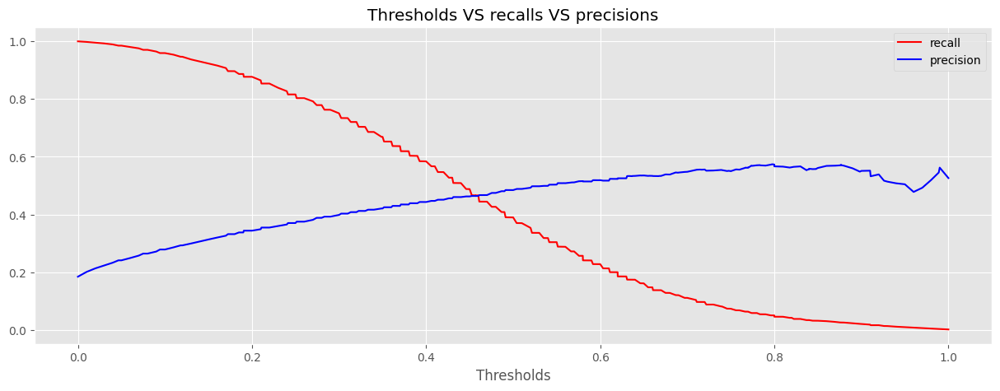

In [ ]:
#3. 이탈예측 대상  등급 확인

#예측값을 판정 열의 값으로 설정
x_test['이탈 판정']=y_pred
x_test = pd.concat([x_test, df_six_plus.loc[x_test.index, 'predict1':'predict6']], axis=1)
df_et=x_test[x_test['이탈 판정']==1]

In [ ]:
df_et['predict1'].value_counts()

4.0    509
5.0    382
3.0    357
2.0     45
1.0     10
Name: predict1, dtype: int64

In [ ]:
df_et['predict2'].value_counts()

4.0    497
5.0    427
3.0    315
2.0     32
1.0     19
Name: predict2, dtype: int64

In [ ]:
df_et['predict3'].value_counts()

4.0    466
5.0    435
3.0    257
2.0     35
1.0      4
Name: predict3, dtype: int64

In [ ]:
df_et['predict4'].value_counts()

5.0    443
4.0    413
3.0    153
2.0     18
1.0      5
Name: predict4, dtype: int64

In [ ]:
df_et['predict5'].value_counts()

5.0    358
4.0    265
3.0     56
2.0      6
1.0      1
Name: predict5, dtype: int64

In [ ]:
df_et['predict6'].value_counts()

5.0    249
4.0    214
3.0      8
2.0      2
Name: predict6, dtype: int64

### 2.4.4.3 모델 비교_평가 및 의의

In [ ]:
#@title 2) Avg_VFM을 통한 Recency변수의 대체(다중 공산성)
#기존 VIF값

# 데이터 프레임으로부터 변수를 선택하여 X에 할당
X= df_six_plus.iloc[:, 1:13]

# X의 상수항(intercept)을 추가
X['intercept'] = 1

# X의 각 변수에 대한 VIF 계산
vif = pd.DataFrame()
vif["Variable"] = X.columns
vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

# 결과 출력
print(vif)

            Variable       VIF
0       6Pre_A_Visit  2.262585
1       5Pre_A_Visit  2.291509
2       4Pre_A_Visit  2.316817
3       3Pre_A_Visit  2.290850
4       2Pre_A_Visit  2.274331
5        Pre_A_Visit  2.262536
6   6Pre_A_Frequency  2.649147
7   5Pre_A_Frequency  2.762003
8   4Pre_A_Frequency  2.820763
9   3Pre_A_Frequency  2.788761
10  2Pre_A_Frequency  2.726021
11   Pre_A_Frequency  2.646792
12         intercept  1.000000


In [ ]:
#Recency 추가 후 VIF값

#다중공산성2_Recency 와 변수
X=df_six_r_scaled.iloc[:,1:49]

# X의 상수항(intercept)을 추가
X['intercept'] = 1

# X의 각 변수에 대한 VIF 계산
vif = pd.DataFrame()
vif["Variable"] = X.columns
vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

# 결과 출력
print(vif)

            Variable        VIF
0       6Pre_A_Visit  10.145408
1       5Pre_A_Visit   9.621671
2       4Pre_A_Visit   9.306603
3       3Pre_A_Visit   9.148488
4       2Pre_A_Visit   8.930225
5        Pre_A_Visit   8.898383
6   6Pre_A_Frequency  10.325881
7   5Pre_A_Frequency  10.494823
8   4Pre_A_Frequency  10.460876
9   3Pre_A_Frequency  10.359928
10  2Pre_A_Frequency  10.104871
11   Pre_A_Frequency   9.809391
12      6Pre_A_Money  20.821495
13      5Pre_A_Money  20.747026
14      4Pre_A_Money  20.673094
15      3Pre_A_Money  20.536060
16      2Pre_A_Money  20.222245
17       Pre_A_Money  19.907672
18        6A_Recency   6.402103
19        5A_Recency   5.996588
20        4A_Recency   5.839831
21        3A_Recency   5.780110
22        2A_Recency   5.590881
23         A_Recency   5.666156
24      6Pre_P_Visit   3.223416
25      5Pre_P_Visit   3.203465
26      4Pre_P_Visit   3.240898
27      3Pre_P_Visit   3.203164
28      2Pre_P_Visit   3.188258
29       Pre_P_Visit   3.204969
30  6Pre

# 2.5 군집 별 구매 아이템 특성 확인

## Preprocessing

In [ ]:
with tf.device(device_name):
  prod = pd.read_csv('/content/drive/MyDrive/4학년 1학기/전공종합설계/롯데 멤버스 데이터/손지영/상품구매정보.csv')
  prod['구매일자']= prod['구매일자'].astype('str').apply(lambda _ : datetime.strptime(_,'%Y-%m-%d'))
  prod['월'] = prod['구매일자'].dt.month
  prod.head()

In [ ]:
df_out = pd.read_csv('고객이탈등급분류.csv') # 2.2.2.2의 군집 결과 사용
wh_cust = df_out[['월', '고객번호', 'predict']]
wh_cust.head()

,월,고객번호,predict
0,1,M000034966,4
1,9,M737888822,4
2,9,M737938990,4
3,9,M737969954,4
4,9,M738341898,4
...,...,...,...
239449,7,M379206583,1
239450,9,M109645845,1
239451,4,M299432206,1
239452,4,M299812938,1


## 2.5.1 Standardization

In [ ]:
with tf.device(device_name):
  df = prod.copy()
  df_ma = df.groupby(['월', '고객번호', '중분류명'])['영수증번호'].count().reset_index()
  df_ma = df_ma.pivot(index=['월', '고객번호'], columns='중분류명', values='영수증번호').fillna(0).reset_index()
  scaler = StandardScaler()
  standardized_data = scaler.fit_transform(df_ma.iloc[:, 2:])
  df_scale = pd.DataFrame(standardized_data, columns=df_ma.iloc[:, 2:].columns)
  df_con = pd.concat([df_ma.iloc[:, :2], df_scale], axis=1)

  #df_con = pd.merge(df_con, demo, on='고객번호', how='left')
  #df_con = df_con[df_con['성별']=='남성'].drop('성별', axis=1)

  df_mer = pd.merge(wh_cust, df_con, on=['고객번호', '월'], how='inner').drop(['월', '고객번호'], axis=1)


  df_pre = df_mer.groupby('predict').mean()
  df_t = df_pre.transpose()
  df_t_df = pd.DataFrame({'clust_1' : df_t.sort_values(by=1, ascending=False).head(20).index.tolist(),
                          'clust_2' : df_t.sort_values(by=2, ascending=False).head(20).index.tolist(),
                          'clust_3' : df_t.sort_values(by=3, ascending=False).head(20).index.tolist(),
                          'clust_4' : df_t.sort_values(by=4, ascending=False).head(20).index.tolist(),
                          'clust_5' : df_t.sort_values(by=5, ascending=False).head(20).index.tolist()})

In [ ]:
df_ma[['스낵류', '잎채소', '국산과일', '이용권/입장권', '스케이트/썰매', '사무기기']].head()

중분류명,스낵류,잎채소,국산과일,이용권/입장권,스케이트/썰매,사무기기
0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0
4,2.0,1.0,5.0,0.0,0.0,0.0


In [ ]:
df_con[['스낵류', '잎채소', '국산과일', '이용권/입장권', '스케이트/썰매', '사무기기']].head()

중분류명,스낵류,잎채소,국산과일,이용권/입장권,스케이트/썰매,사무기기
0,-0.419244,-0.375185,-0.405857,-0.045609,-0.005254,-0.004527
1,-0.419244,-0.375185,-0.405857,-0.045609,-0.005254,-0.004527
2,-0.419244,-0.375185,-0.405857,-0.045609,-0.005254,-0.004527
3,-0.419244,-0.375185,-0.405857,-0.045609,-0.005254,-0.004527
4,0.475386,0.396533,3.308605,-0.045609,-0.005254,-0.004527


Text(0.5, 1.0, '5번 군집')

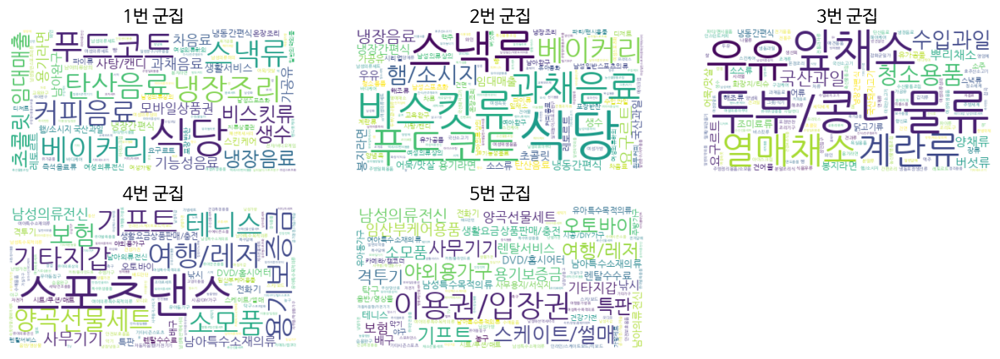

In [ ]:
#@title wordcloud
wordcloud_1 = WordCloud(
                      font_path='font/NanumGothic.ttf',
                      background_color='white',
                      random_state = 42,
                      max_words = 200).generate_from_frequencies(dict(zip(df_t.index, df_t[1].values)))
wordcloud_2 = WordCloud(
                      font_path='font/NanumGothic.ttf',
                      background_color='white',
                      random_state = 42,
                      max_words = 200).generate_from_frequencies(dict(zip(df_t.index, df_t[2].values)))
wordcloud_3 = WordCloud(
                      font_path='font/NanumGothic.ttf',
                      background_color='white',
                      random_state = 42,
                      max_words = 200).generate_from_frequencies(dict(zip(df_t.index, df_t[3].values)))
wordcloud_4 = WordCloud(
                      font_path='font/NanumGothic.ttf',
                      background_color='white',
                      random_state = 42,
                      max_words = 200).generate_from_frequencies(dict(zip(df_t.index, df_t[4].values)))
wordcloud_5 = WordCloud(
                      font_path='font/NanumGothic.ttf',
                      background_color='white',
                      random_state = 42,
                      max_words = 200).generate_from_frequencies(dict(zip(df_t.index, df_t[5].values)))
plt.figure(figsize = ((15, 5)))
# 유통사01
plt.subplot(2, 3, 1)
plt.imshow(wordcloud_1, interpolation = "bilinear")
plt.axis("off")
plt.title('1번 군집', fontsize=15)
# 유통사02
plt.subplot(2, 3, 2)
plt.imshow(wordcloud_2, interpolation = "bilinear")
plt.axis("off")
plt.title('2번 군집', fontsize=15)
# 유통사03
plt.subplot(2, 3, 3)
plt.imshow(wordcloud_3, interpolation = "bilinear")
plt.axis("off")
plt.title('3번 군집', fontsize=15)
# 유통사04
plt.subplot(2, 3, 4)
plt.imshow(wordcloud_4, interpolation = "bilinear")
plt.axis("off")
plt.title('4번 군집', fontsize=15)
# 유통사05
plt.subplot(2, 3, 5)
plt.imshow(wordcloud_5, interpolation = "bilinear")
plt.axis("off")
plt.title('5번 군집', fontsize=15)


## 2.5.2 TF-IDF

In [ ]:
with tf.device(device_name):
  df = prod.copy()
  #df = df[df['연령대']=='70대']
  df_ma = df.groupby(['월', '고객번호', '중분류명'])['영수증번호'].count().reset_index()
  df_ma = df_ma.pivot(index=['월', '고객번호'], columns='중분류명', values='영수증번호').fillna(0).reset_index()
  df_mer = pd.merge(wh_cust, df_ma, on=['고객번호', '월'], how='inner').drop(['월', '고객번호'], axis=1)

  tfidf = TfidfTransformer(norm=None, sublinear_tf=True)
  tfidf_matrix = tfidf.fit_transform(df_mer.iloc[:, 1:])

  # 정규화된 TF-IDF 값을 데이터프레임에 추가
  df_tf = pd.DataFrame(tfidf_matrix.toarray(), columns=df_mer.iloc[:, 1:].columns, index=df_mer.iloc[:, 0]).reset_index()
  df_tf_all = df_tf.copy()
  df_tf = df_tf.groupby('predict').mean()

  df_t = df_tf.transpose()
  df_t_df = pd.DataFrame({'clust_1' : df_t.sort_values(by=1, ascending=False).head(20).index.tolist(),
                          'clust_2' : df_t.sort_values(by=2, ascending=False).head(20).index.tolist(),
                          'clust_3' : df_t.sort_values(by=3, ascending=False).head(20).index.tolist(),
                          'clust_4' : df_t.sort_values(by=4, ascending=False).head(20).index.tolist(),
                          'clust_5' : df_t.sort_values(by=5, ascending=False).head(20).index.tolist()})

In [ ]:
df_mer[['스낵류', '잎채소', '국산과일', '탄산음료', '냉장조리', '일반담배']].tail()

,스낵류,잎채소,국산과일,탄산음료,냉장조리,일반담배
211784,0.0,0.0,0.0,0.0,0.0,0.0
211785,0.0,0.0,0.0,0.0,0.0,0.0
211786,0.0,0.0,0.0,1.0,0.0,0.0
211787,2.0,3.0,1.0,0.0,0.0,0.0
211788,2.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
df_tf_all[['스낵류', '잎채소', '국산과일', '탄산음료', '냉장조리', '일반담배']].tail()

,스낵류,잎채소,국산과일,탄산음료,냉장조리,일반담배
211784,0.000000,0.000000,0.000000,0.000000,0.0,0.0
211785,0.000000,0.000000,0.000000,0.000000,0.0,0.0
211786,0.000000,0.000000,0.000000,2.811337,0.0,0.0
211787,3.630511,5.298676,2.373692,0.000000,0.0,0.0
211788,3.630511,0.000000,0.000000,0.000000,0.0,0.0


Text(0.5, 1.0, '5번 군집')

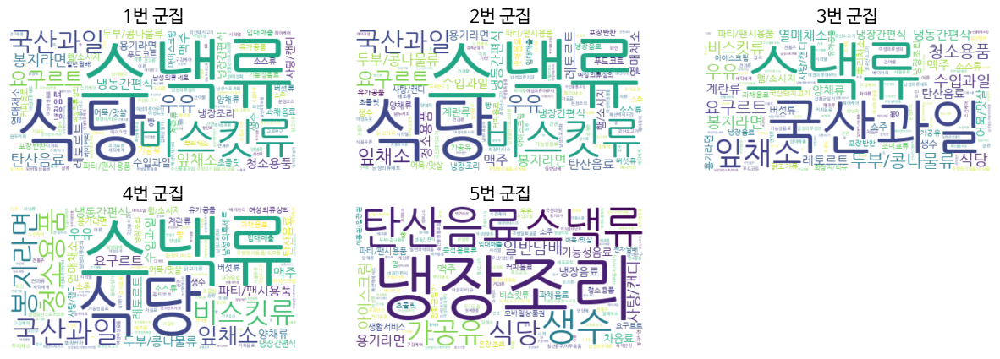

In [ ]:
#@title wordcloud
wordcloud_1 = WordCloud(
                      font_path='font/NanumGothic.ttf',
                      background_color='white',
                      random_state = 42,
                      max_words = 200).generate_from_frequencies(dict(zip(df_t.index, df_t[1].values)))
wordcloud_2 = WordCloud(
                      font_path='font/NanumGothic.ttf',
                      background_color='white',
                      random_state = 42,
                      max_words = 200).generate_from_frequencies(dict(zip(df_t.index, df_t[2].values)))
wordcloud_3 = WordCloud(
                      font_path='font/NanumGothic.ttf',
                      background_color='white',
                      random_state = 42,
                      max_words = 200).generate_from_frequencies(dict(zip(df_t.index, df_t[3].values)))
wordcloud_4 = WordCloud(
                      font_path='font/NanumGothic.ttf',
                      background_color='white',
                      random_state = 42,
                      max_words = 200).generate_from_frequencies(dict(zip(df_t.index, df_t[4].values)))
wordcloud_5 = WordCloud(
                      font_path='font/NanumGothic.ttf',
                      background_color='white',
                      random_state = 42,
                      max_words = 200).generate_from_frequencies(dict(zip(df_t.index, df_t[5].values)))
plt.figure(figsize = ((15, 5)))
# 유통사01
plt.subplot(2, 3, 1)
plt.imshow(wordcloud_1, interpolation = "bilinear")
plt.axis("off")
plt.title('1번 군집', fontsize=15)
# 유통사02
plt.subplot(2, 3, 2)
plt.imshow(wordcloud_2, interpolation = "bilinear")
plt.axis("off")
plt.title('2번 군집', fontsize=15)
# 유통사03
plt.subplot(2, 3, 3)
plt.imshow(wordcloud_3, interpolation = "bilinear")
plt.axis("off")
plt.title('3번 군집', fontsize=15)
# 유통사04
plt.subplot(2, 3, 4)
plt.imshow(wordcloud_4, interpolation = "bilinear")
plt.axis("off")
plt.title('4번 군집', fontsize=15)
# 유통사05
plt.subplot(2, 3, 5)
plt.imshow(wordcloud_5, interpolation = "bilinear")
plt.axis("off")
plt.title('5번 군집', fontsize=15)


# 2.6 군집 별 EDA 및 고객 분석

In [ ]:
result = pd.read_csv('고객이탈등급분류.csv') # 2.2.2.2의 군집 결과 사용

## 2.6.1 평균 구매, 방문 주기 EDA


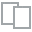
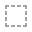
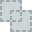
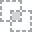
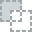
...
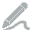
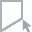
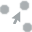
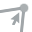
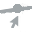

In [ ]:
#평균 상품구매 방문주기
plot(result, 'predict', 'P_Avg_Visit')


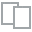
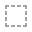
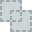
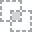
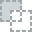
...
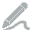
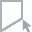
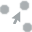
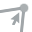
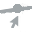

In [ ]:
#평균 제휴사 방문주기
result = result[result['A_Avg_Visit'] < 80]
plot(result, 'predict', 'A_Avg_Visit')

## 2.6.2 월별 상품 구매 건수 및 제휴사 이용 건수 EDA


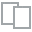
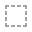
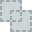
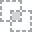
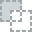
...
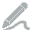
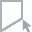
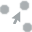
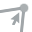
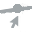

In [ ]:
#상품구매 건수
plot(result, 'predict', 'P_Frequency')


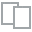
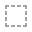
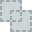
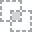
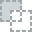
...
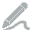
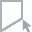
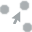
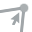
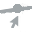

In [ ]:
#제휴사 이용건수
plot(result, 'predict', 'A_Frequency')

## 2.6.3 월별 구매 금액 EDA

<Axes: xlabel='predict'>

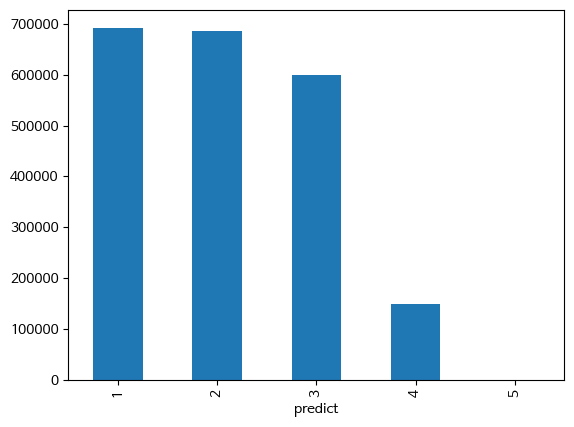

In [ ]:
#평균 총 상품구매 금액
result.groupby("predict")['P_Money'].mean().plot(kind='bar')

<Axes: xlabel='predict'>

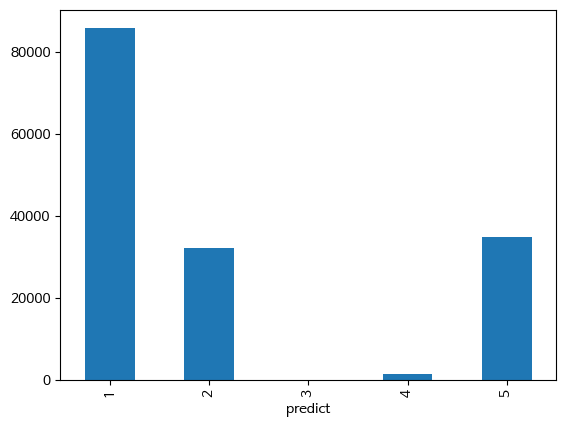

In [ ]:
#평균 총 제휴사이용 금액
result.groupby("predict")['A_Money'].mean().plot(kind='bar')

## 2.6.4 상품 구매, 제휴사 이용 통합 EDA

In [ ]:
cus_buy = pd.read_csv('/content/drive/MyDrive/cus_buy.csv')
cus_aff = pd.read_csv('/content/drive/MyDrive/cus_aff.csv')

In [ ]:
cluster=result.drop(columns=['P_Avg_Visit','P_Frequency','P_Money','A_Avg_Visit','A_Frequency','A_Money'])
bb = pd.merge(cluster, cus_buy, on=['고객번호','월'])

### 2.6.4.1 월별 구매 수량 & 총 사용 금액



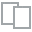
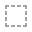
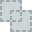
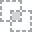
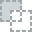
...
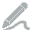
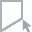
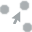
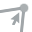
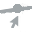

In [ ]:
#총구매수량
plot(bb, "predict","구매수량합")

<Axes: xlabel='predict'>

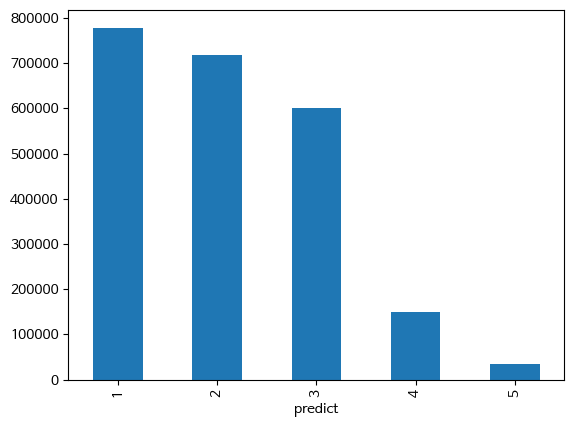

In [ ]:
#총 사용금액
result['Money'] = result['P_Money'] + result['A_Money']
result.groupby("predict")['Money'].mean().plot(kind='bar')

### 2.6.4.2 엘페이 이용률 EDA

In [ ]:
c1 = lpay_result[lpay_result['predict'] == 1]['고객번호']
c2 = lpay_result[lpay_result['predict'] == 2]['고객번호']
c3 = lpay_result[lpay_result['predict'] == 3]['고객번호']
c4 = lpay_result[lpay_result['predict'] == 4]['고객번호']
c5 = lpay_result[lpay_result['predict'] == 5]['고객번호']

In [ ]:
unuse_Lpay = lpay_result[lpay_result['고객번호'].isin(set(lpay_result[lpay_result['lpay'] == 'lpay']['고객번호'])) == False]['고객번호']
useLpay = lpay_result[lpay_result['고객번호'].isin(set(lpay_result[lpay_result['lpay'] == 'lpay']['고객번호']))]['고객번호']

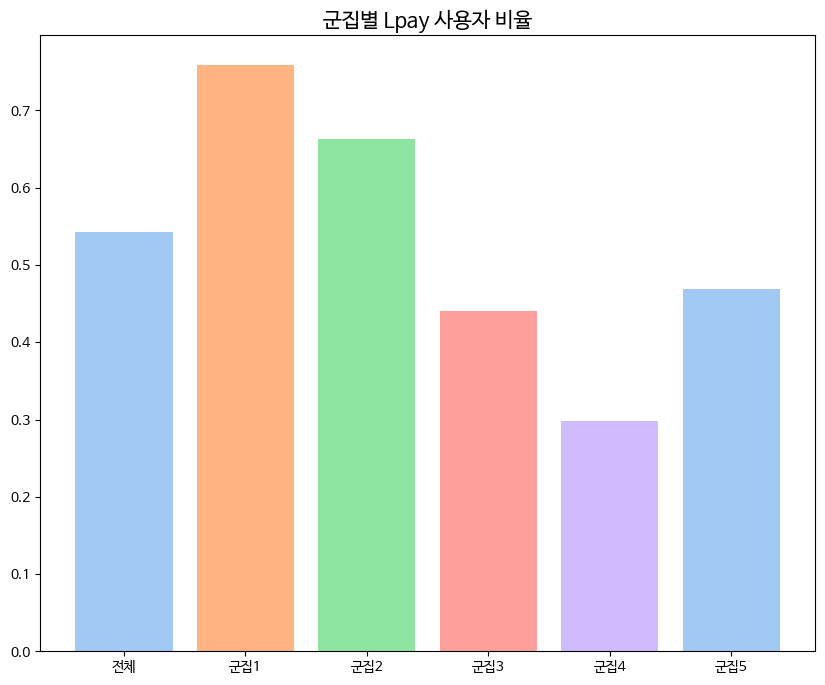

In [ ]:
# Lpay이용자의 비율을 확인
## 전체
lpay_ratio = [(len(useLpay) / len(lpay_result)),  (len(c1[c1.isin(useLpay)]) / len(c1)), (len(c2[c2.isin(useLpay)]) / len(c2)),
            (len(c3[c3.isin(useLpay)]) / len(c3)), (len(c4[c4.isin(useLpay)]) / len(c4)) , (len(c5[c5.isin(useLpay)]) / len(c5))]

colors = sns.color_palette('pastel',5)
plt.figure(figsize=(10, 8))
plt.bar(['전체', '군집1', '군집2', '군집3', '군집4', '군집5'], lpay_ratio, color = colors)
plt.title('군집별 Lpay 사용자 비율', fontsize=15)
plt.show()

In [ ]:
lpay_result = lpay_result.drop(columns=['월'])

In [ ]:
# 이전 시각화와 라벨을 맞춰줌
c1 = lpay_result[lpay_result['predict'] == 1]['고객번호']
c2 = lpay_result[lpay_result['predict'] == 2]['고객번호']
c3 = lpay_result[lpay_result['predict'] == 3]['고객번호']
c4 = lpay_result[lpay_result['predict'] == 4]['고객번호']
c5 = lpay_result[lpay_result['predict'] == 5]['고객번호']

In [ ]:
unuse_Lpay = lpay_result[lpay_result['고객번호'].isin(set(lpay_result[lpay_result['lpay'] == 'lpay']['고객번호'])) == False]['고객번호']
useLpay = lpay_result[lpay_result['고객번호'].isin(set(lpay_result[lpay_result['lpay'] == 'lpay']['고객번호']))]['고객번호']

In [ ]:
# Lpay이용자의 비율을 확인
## 전체
lpay_ratio = [(len(useLpay) / len(lpay_result)),  (len(c1[c1.isin(useLpay)]) / len(c1)), (len(c2[c2.isin(useLpay)]) / len(c2)),
            (len(c3[c3.isin(useLpay)]) / len(c3)), (len(c4[c4.isin(useLpay)]) / len(c4)) , (len(c5[c5.isin(useLpay)]) / len(c5))]

colors = sns.color_palette('pastel',5)
plt.figure(figsize=(10, 8))
plt.bar(['전체', '군집1', '군집2', '군집3', '군집4', '군집5'], lpay_ratio, color = colors)
plt.title('군집별 Lpay 사용자 비율', fontsize=15)
plt.show()

In [ ]:
lpay_x = [
          lpay_result[lpay_result['고객번호'].isin(unuse_Lpay)]['금액'].mean(),
          lpay_result[lpay_result['고객번호'].isin(c1[c1.isin(useLpay)==False])]['금액'].mean(),
          lpay_result[lpay_result['고객번호'].isin(c2[c2.isin(useLpay)==False])]['금액'].mean(),
          lpay_result[lpay_result['고객번호'].isin(c3[c3.isin(useLpay)==False])]['금액'].mean(),
          lpay_result[lpay_result['고객번호'].isin(c4[c4.isin(useLpay)==False])]['금액'].mean(),
          lpay_result[lpay_result['고객번호'].isin(c5[c5.isin(useLpay)==False])]['금액'].mean()
         ]
lpay_o = [lpay_result[lpay_result['고객번호'].isin(useLpay)]['금액'].mean(), lpay_result[lpay_result['고객번호'].isin(c1[c1.isin(useLpay)])]['금액'].mean(),
          lpay_result[lpay_result['고객번호'].isin(c2[c2.isin(useLpay)])]['금액'].mean(), lpay_result[lpay_result['고객번호'].isin(c3[c3.isin(useLpay)])]['금액'].mean(),
          lpay_result[lpay_result['고객번호'].isin(c4[c4.isin(useLpay)])]['금액'].mean(), lpay_result[lpay_result['고객번호'].isin(c5[c5.isin(useLpay)])]['금액'].mean()]

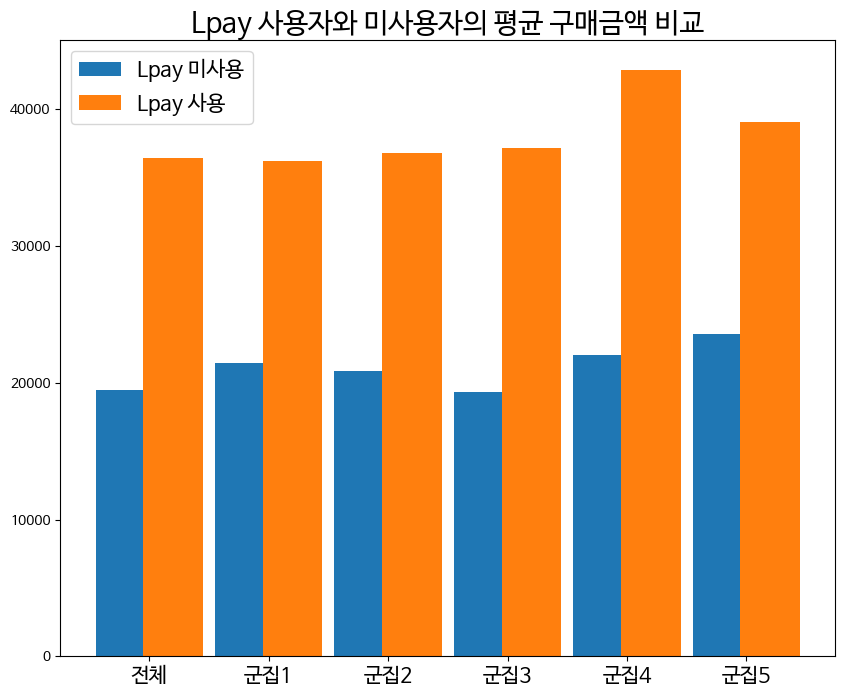

In [ ]:
# 유형 3의 경우 Lpay를 사용하지 않는 고객의 평균 구매비용이 더 높음
x = np.arange(6)

plt.figure(figsize=(10, 8))
plt.bar(x-0.2, [lpay_x[0], lpay_x[1], lpay_x[2], lpay_x[3], lpay_x[4], lpay_x[5]], 0.5, label='Lpay 미사용')
plt.bar(x+0.2, [lpay_o[0], lpay_o[1], lpay_o[2], lpay_o[3],lpay_o[4], lpay_o[5]], 0.5, label='Lpay 사용')
plt.xticks(x, ['전체', '군집1', '군집2', '군집3', '군집4','군집5'], fontsize = 15)
plt.legend(fontsize = 15)
plt.title('Lpay 사용자와 미사용자의 평균 구매금액 비교', fontsize=20)
plt.show()

## 2.6.5 고객별 EDA 분석 정리
- 정규화와 TF-IDF를 적용한 워드클라우드는 2.5 파트에 정리되어 있음

In [ ]:
stor = pd.read_csv('/content/drive/MyDrive/4학년 1학기/전공종합설계/롯데 멤버스 데이터/손지영/제휴사이용정보.csv')
stor['이용일자']= stor['이용일자'].astype('str').apply(lambda _ : datetime.strptime(_,'%Y-%m-%d'))
stor['월'] = stor['이용일자'].dt.month
df = stor.copy()

In [ ]:
df_ma = df.groupby(['월', '고객번호', '제휴사'])['영수증번호'].count().reset_index()
df_ma = df_ma.pivot(index=['월', '고객번호'], columns='제휴사', values='영수증번호').fillna(0).reset_index()
df_mer = pd.merge(wh_cust, df_ma, on=['고객번호', '월'], how='inner').drop(['월', '고객번호'], axis=1)
tfidf = TfidfTransformer(norm=None, sublinear_tf=True)
tfidf_matrix = tfidf.fit_transform(df_mer.iloc[:, 1:])

# 정규화된 TF-IDF 값을 데이터프레임에 추가
df_tf = pd.DataFrame(tfidf_matrix.toarray(), columns=df_mer.iloc[:, 1:].columns, index=df_mer.iloc[:, 0]).reset_index()
df_tf_all = df_tf.copy()
df_tf = df_tf.groupby('predict').mean()

df_t = df_tf.transpose()
df_t_df = pd.DataFrame({'clust_1' : df_t.sort_values(by=1, ascending=False).head(20).index.tolist(),
                          'clust_2' : df_t.sort_values(by=2, ascending=False).head(20).index.tolist(),
                          'clust_3' : df_t.sort_values(by=3, ascending=False).head(20).index.tolist(),
                          'clust_4' : df_t.sort_values(by=4, ascending=False).head(20).index.tolist(),
                          'clust_5' : df_t.sort_values(by=5, ascending=False).head(20).index.tolist()})

Text(0.5, 1.0, '5번 군집')

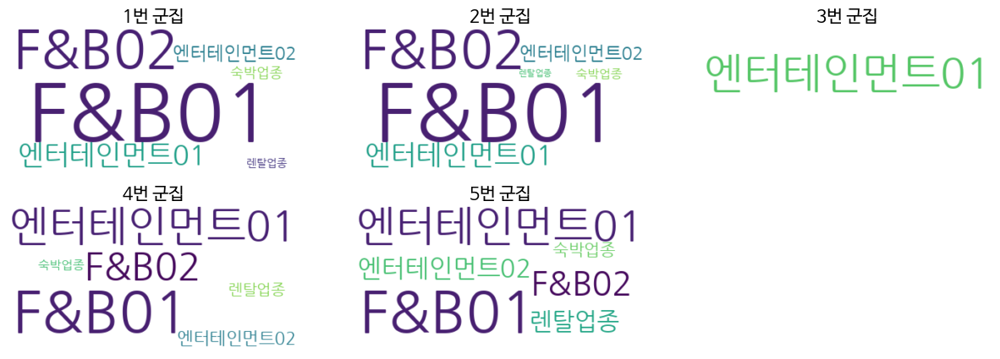

In [ ]:
wordcloud_1 = WordCloud(
                      font_path='font/NanumGothic.ttf',
                      background_color='white',
                      random_state = 42,
                      max_words = 200).generate_from_frequencies(dict(zip(df_t.index, df_t[1].values)))
wordcloud_2 = WordCloud(
                      font_path='font/NanumGothic.ttf',
                      background_color='white',
                      random_state = 42,
                      max_words = 200).generate_from_frequencies(dict(zip(df_t.index, df_t[2].values)))
wordcloud_3 = WordCloud(
                      font_path='font/NanumGothic.ttf',
                      background_color='white',
                      random_state = 42,
                      max_words = 200).generate_from_frequencies(dict(zip(df_t.index, df_t[3].values)))
wordcloud_4 = WordCloud(
                      font_path='font/NanumGothic.ttf',
                      background_color='white',
                      random_state = 42,
                      max_words = 200).generate_from_frequencies(dict(zip(df_t.index, df_t[4].values)))
wordcloud_5 = WordCloud(
                      font_path='font/NanumGothic.ttf',
                      background_color='white',
                      random_state = 42,
                      max_words = 200).generate_from_frequencies(dict(zip(df_t.index, df_t[5].values)))
plt.figure(figsize = ((15, 5)))
# 유통사01
plt.subplot(2, 3, 1)
plt.imshow(wordcloud_1, interpolation = "bilinear")
plt.axis("off")
plt.title('1번 군집', fontsize=15)
# 유통사02
plt.subplot(2, 3, 2)
plt.imshow(wordcloud_2, interpolation = "bilinear")
plt.axis("off")
plt.title('2번 군집', fontsize=15)
# 유통사03
plt.subplot(2, 3, 3)
plt.imshow(wordcloud_3, interpolation = "bilinear")
plt.axis("off")
plt.title('3번 군집', fontsize=15)
# 유통사04
plt.subplot(2, 3, 4)
plt.imshow(wordcloud_4, interpolation = "bilinear")
plt.axis("off")
plt.title('4번 군집', fontsize=15)
# 유통사05
plt.subplot(2, 3, 5)
plt.imshow(wordcloud_5, interpolation = "bilinear")
plt.axis("off")
plt.title('5번 군집', fontsize=15)
